In [1]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix
from itertools import product

sns.set_style('whitegrid')

# sns.set_context('notebook')

# %matplotlib notebook
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200

%load_ext autoreload
%autoreload 2

dev = 'cuda'
from utils import get_data

In [2]:
def get_idx(dd, cond):
    return dd.query(cond).index.tolist()

def plot_manifold(dc, r, dims=[0, 1, 2], key='widen', queries=[4,8], cmap='vlag',cdict=None, ckey=''):
    d = len(dims)
    fsize = (10,10) if d==3 else (8,6)
    fig = plt.figure(1, figsize=fsize)
    plt.clf();
    if d==3:
        ax = fig.add_subplot(projection='3d')
    else:
        ax = fig.add_subplot()
    ee = r['e']
    print(ee)
    
    markers = ['s', '*', 'o', 'x']
    
    c = dc[ckey]
    if cdict:
        c = c.map(cdict)
    for (i, k) in enumerate(queries):
        ii = get_idx(dc, f't > 0 & {key} == {k}')
        xx = r['xp'][ii]

        if d == 3:
            sc = ax.scatter(xx[:,dims[0]], xx[:,dims[1]], xx[:,dims[2]],
                        c=c[ii], s=3, cmap=cmap, vmin=c.min(), vmax=c.max(), alpha=0.5,
                        marker=markers[i], label=k)
            ax.set_zlabel('pc2');
        elif d == 2:
            sc = ax.scatter(xx[:, dims[0]], xx[:, dims[1]], c=c, cmap=cmap, label=k,  marker=markers[i])
        ax.set_xlabel('pc0'); ax.set_ylabel('pc1');
#     clb=plt.colorbar(sc, pad=0.2);
#     clb.ax.set_title(ckey)
    ax.legend()
    return ax


def triplot(dc, r, d=3, key='widen', queries=[4,8], cmap='vlag',cdict=None, ckey='', evals=False, plot_avg=False, avggroupby=['opt']):
    
    figs,axs = plt.subplots(d-1, d-1, figsize=(10,10), sharex=True, sharey=True)
    markers = ["o", "x", "s", "*", "+"]
    ee = r['e']
    c = dc[ckey]
    if cdict:
        c = c.map(cdict)
        print(cdict)
    for (i1, d1) in enumerate(range(d-1)):
        for (i2, d2) in enumerate(range(d1+1, d)):
            ax = axs[d2-1, d1]
            ax.axis("square")
            for (i, k) in enumerate(queries):
                ii = get_idx(dc, f't >= 0 & {key} == {k}')
                xx = r['xp'][ii]

                sc = ax.scatter(xx[:, d1], xx[:, d2], 
                                c=c[ii], cmap=cmap, vmin=c.min(), vmax=c.max(),
                                label=k,  marker=markers[i], s=3, lw=0.5, alpha=0.5)

                #                 sc = ax.plot(xx[:, d1], xx[:, d2], label=k, lw=0.5)
                if ee[d1] < 0:
                    ax.spines['bottom'].set_color('red')
                if ee[d2] < 0:
                    ax.spines['left'].set_color('red')
                ax.set_xlabel(f'pc{d1}'); ax.set_ylabel(f'pc{d2}')
            if plot_avg:
                iavg = get_idx(dc, f't >= 0 & seed == -1')
                for (k, v) in dc.iloc[iavg].groupby(avggroupby).indices.items():
                    avg_ms = r['xp'][v]
                    avg = sns.lineplot(x=avg_ms[:, d1], y=avg_ms[:, d2], 
                                label=k, ax=ax, legend=False, lw=1.0)
    handles, labels = ax.get_legend_handles_labels()
    if evals:
        ax = figs.add_subplot(d-1, d-1, 2)
        ax.set_yscale('log')
        ax.grid()
        w=0.5
        for e in ee:
            ax.plot((-w/4, w/4), (np.abs(e),np.abs(e)),
                     c='k' if e > 0 else 'r')
        ax.set_xlim([-w/2,w/2])
        ax.get_xaxis().set_visible(False)
    
    
    ax = axs[0, -1]
    clb=plt.colorbar(sc, pad=0.2, ax=ax);
    clb.ax.set_title(ckey)
    ax = axs[0, -1]
    ax.legend(handles, labels, loc = 'lower center')

In [3]:
# models = ["'wr-4-8'", "'allcnn-96-144'", "'fc-1024-512-256-128'"]
# opts = ["'adam'", "'sgdn'", "'sgd'"]
models = ["'wr-4-8'"]
opts = [ "'sgd'"]
bns = [True]
mdict = {m.strip("''"):i for (i, m) in enumerate(models)}
odict = {o.strip("''"):i for (i, o) in enumerate(opts)}

/tmp/ipykernel_7942/1629149039.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0}


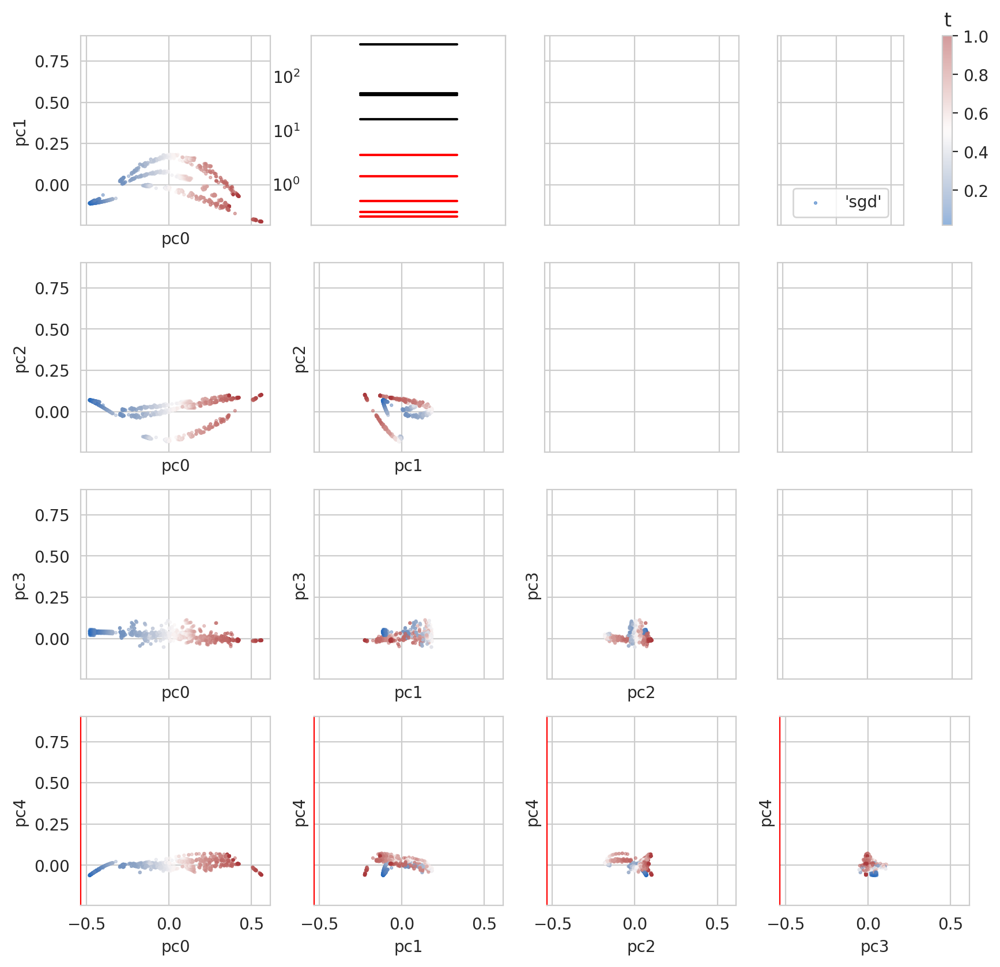

In [8]:
loc = 'inpca_results'
fn = 'yh_new_avg'
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='t', cmap='vlag', 
        evals=True, plot_avg=False)
# plot_manifold(dc, r, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1')
# triplot(dc, r, d=5, key='m', queries=models, ckey='s', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


/tmp/ipykernel_6916/1113371531.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


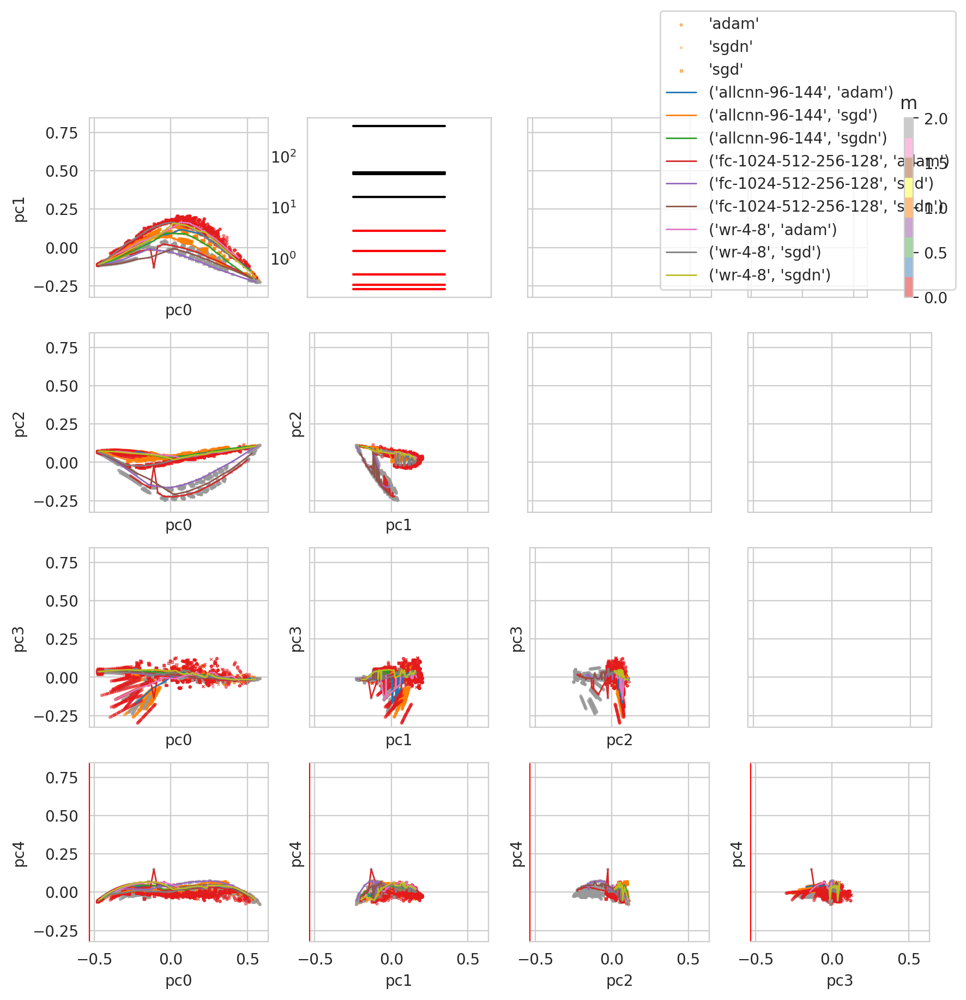

In [8]:
loc = 'inpca_results'
fn = 'yh_new_avg'
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='m', cmap='Set1', cdict=mdict, 
        evals=True, plot_avg=True, avggroupby=['m', 'opt'])
# plot_manifold(dc, r, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1')
# triplot(dc, r, d=5, key='m', queries=models, ckey='s', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

{'ViT': 0, 'convmixer': 1, 'wide_resnet': 2, 'true': 3, 'random': 4}
{'ViT': 0, 'convmixer': 1, 'wide_resnet': 2, 'true': 3, 'random': 4}


/tmp/ipykernel_11536/1629149039.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


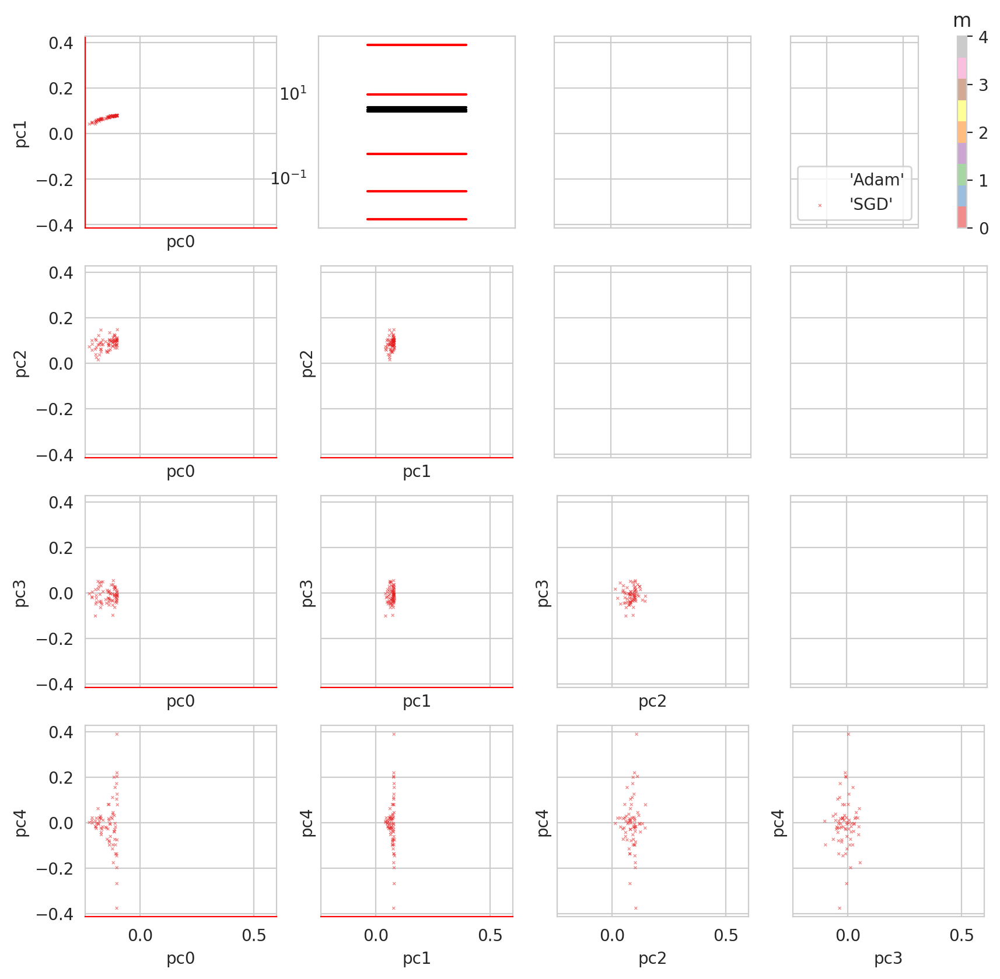

In [12]:
loc = 'inpca_results'
fn = 'yh_more_ckpts_with_ends'
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
models = ["'ViT'", "'convmixer'", "'wide_resnet'", "'true'", "'random'"]
opts = ["'Adam'", "'SGD'"]
# opts = ["'SGD'", "'Adam'"]
# models = ["'ViT'", "'wide_resnet'"]
# opts = ["'AdamW'", "'SGD'", "'Adam'"]
bns = [True]
mdict = {m.strip("''"):i for (i, m) in enumerate(models)}
odict = {o.strip("''"):i for (i, o) in enumerate(opts)}


# triplot(dc, r, d=5, key='m', queries=models, ckey='opt', cdict=odict, cmap='Set1', evals=True)
triplot(dc.iloc[800:], r, d=5, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2212029868.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'wr-10-4-8': 1, 'allcnn-96-144': 2, 'fc-1024-512-256-128': 3}


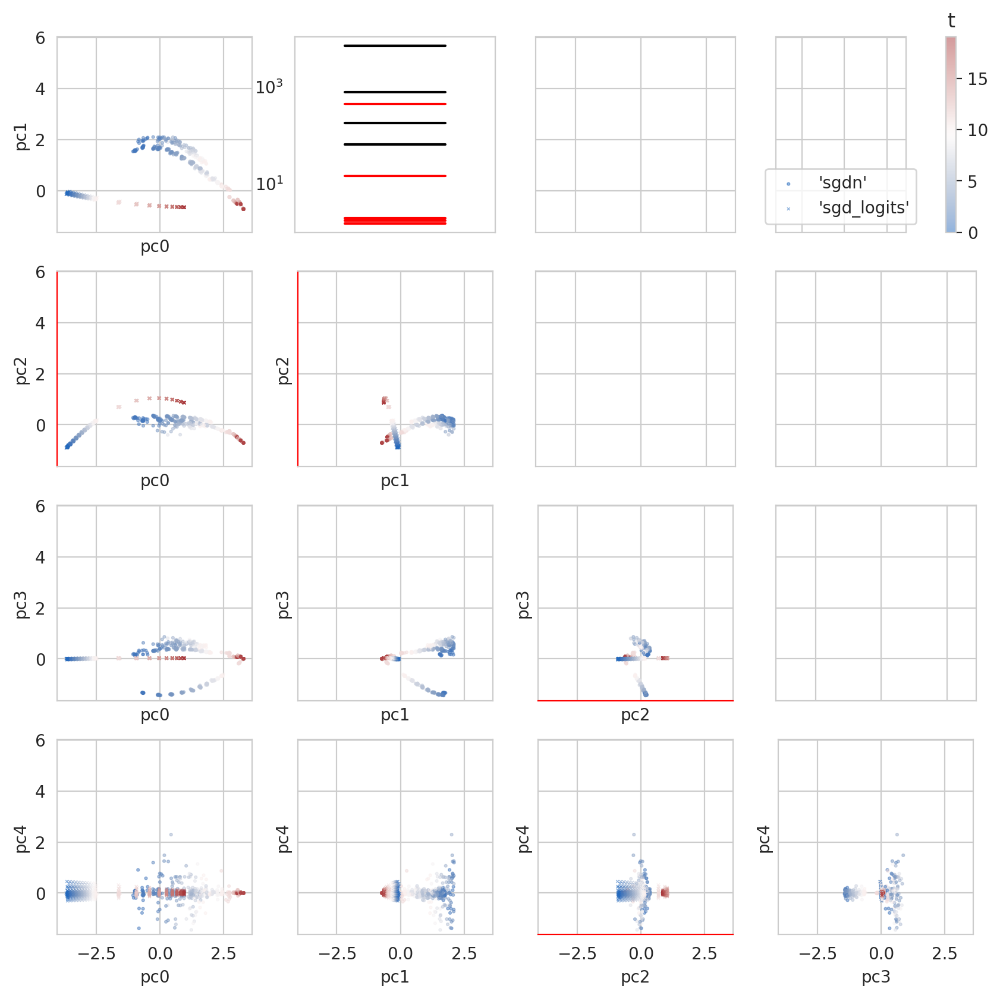

In [12]:
loc = 'inpca_results'
fn = 'yh_logits_sgd'
models = ["'wr-4-8'", "'wr-10-4-8'", "'allcnn-96-144'", "'fc-1024-512-256-128'"]
opts = ["'sgdn'", "'sgd_logits'"]
mdict = {m.strip("''"):i for (i, m) in enumerate(models)}
odict = {o.strip("''"):i for (i, o) in enumerate(opts)}
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='t', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


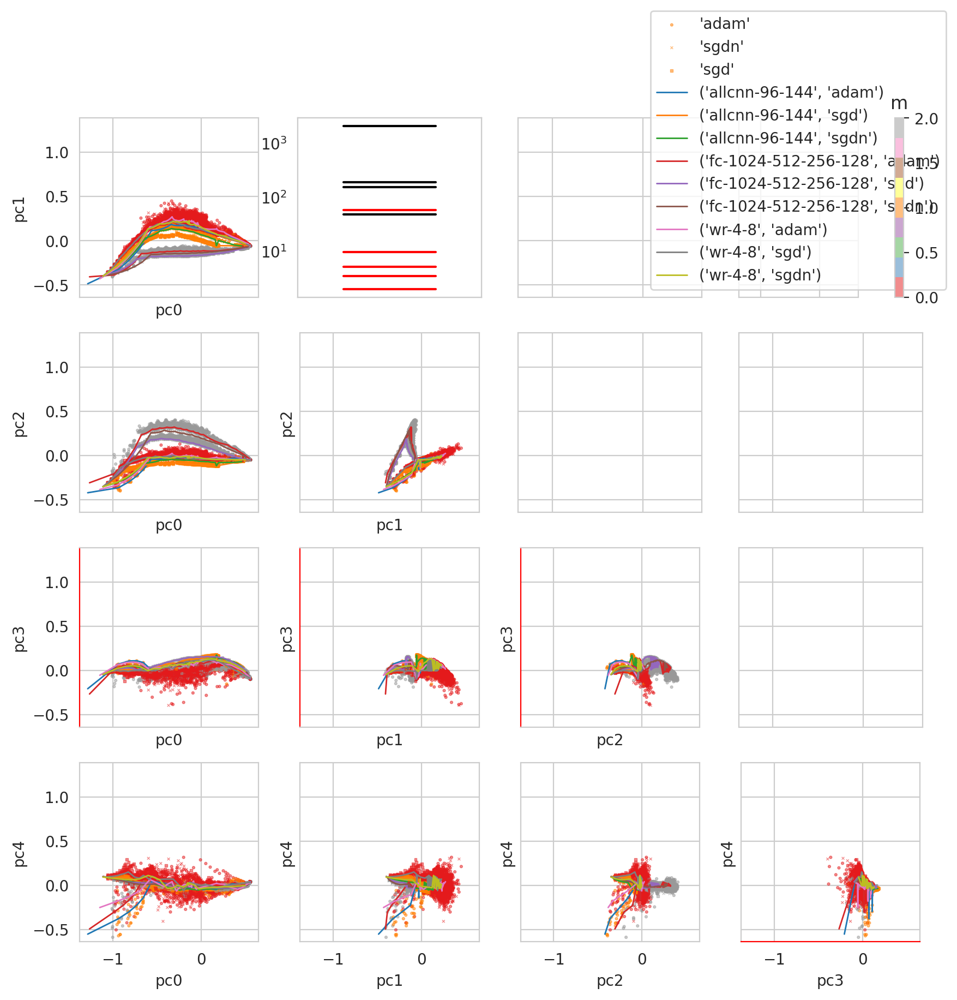

In [23]:
loc = 'inpca_results'
fn = 'yh_new_interpolate_with_avg'
# the averaged models are also taken with high-training-error models dropped
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1', evals=True, plot_avg=True, avggroupby=['m', 'opt'])
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


/tmp/ipykernel_6916/1113371531.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


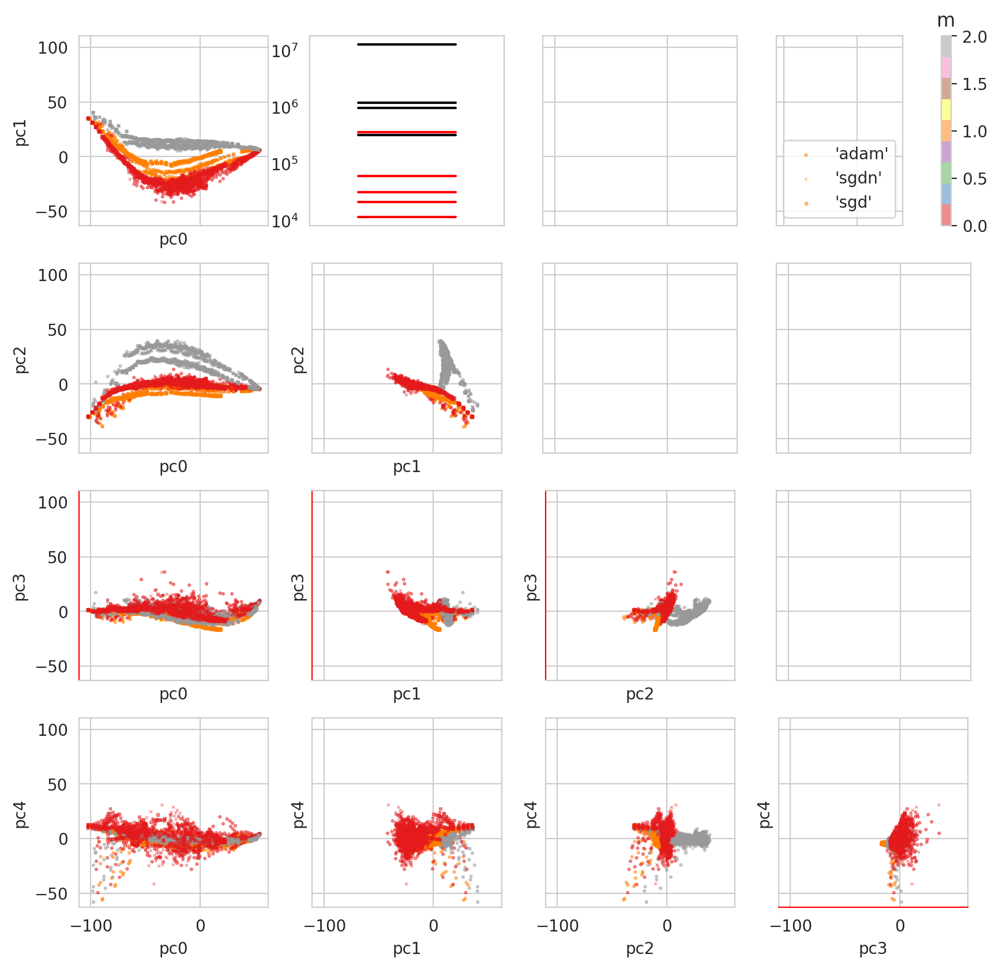

In [7]:
loc = 'inpca_results'
fn = 'yh_new_interpolate'
# the averaged models are also taken with high-training-error models dropped
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
# plot_manifold(dc, r, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1')
triplot(dc, r, d=5, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1', evals=True, plot_avg=False, avggroupby=['m'])
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_4944/1113371531.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


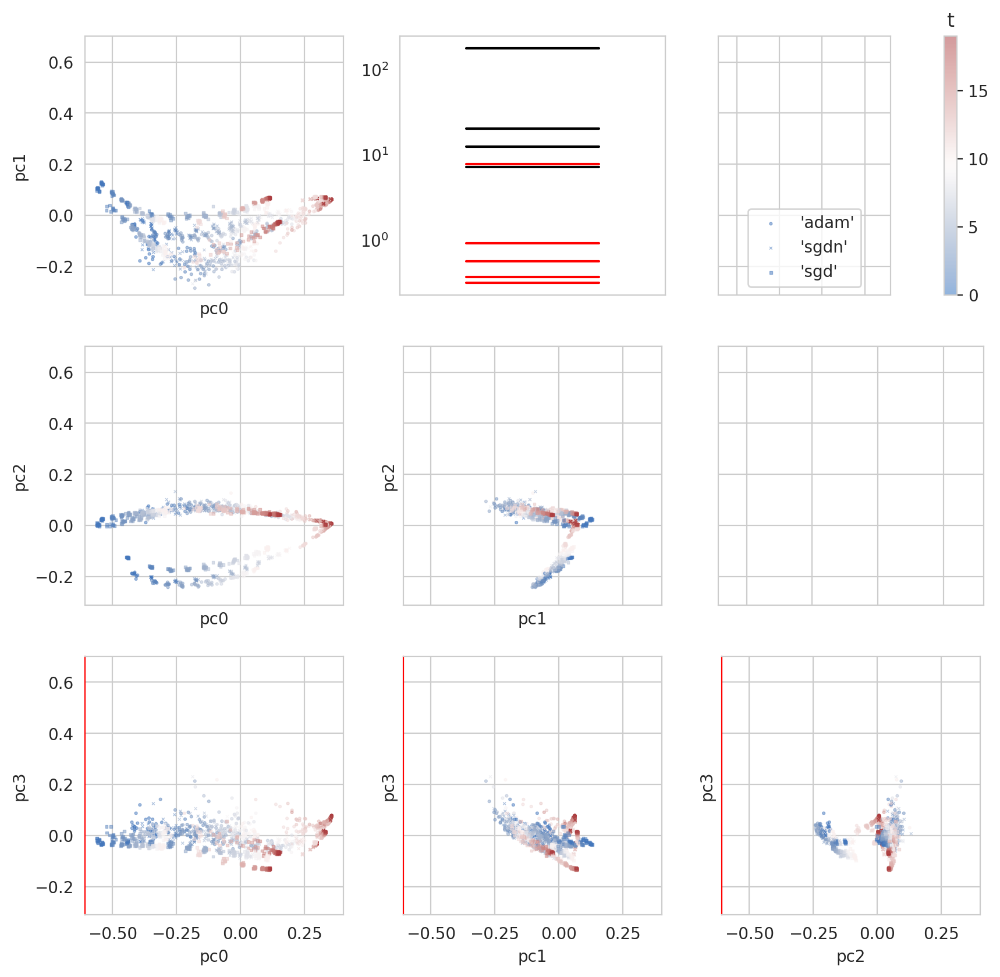

In [6]:
loc = 'inpca_results'
fn = 'yh_new_all_bn'
# the averaged models are also taken with high-training-error models dropped
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc , r, d=4, 
        key='opt', queries=opts, ckey='t', evals=True, plot_avg=False, avggroupby=['m'])
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


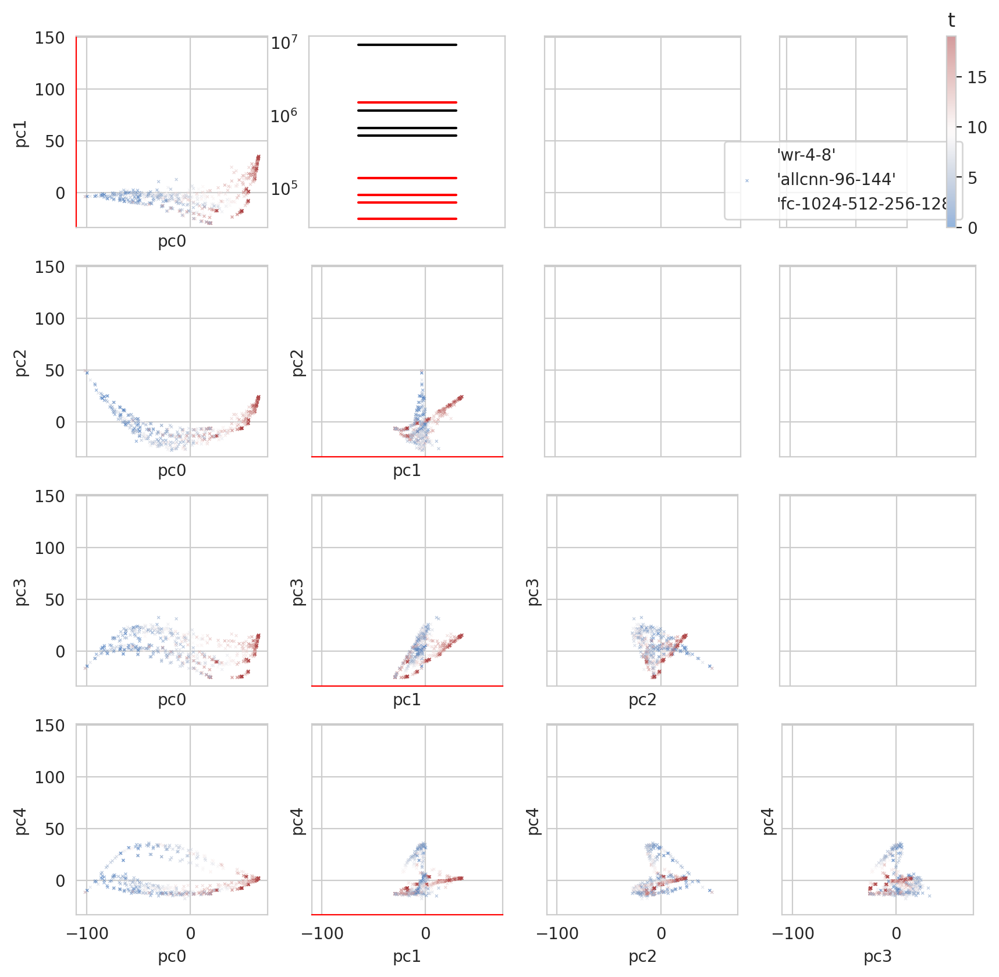

In [26]:
loc = 'inpca_results'
fn = 'yh_new_all_with_avg'
# the averaged models are also taken with high-training-error models dropped
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc.iloc[get_idx(dc, f"bn==True & m == {models[1]}")].reset_index(), r, d=5, 
        key='m', queries=models, ckey='t', evals=True, plot_avg=True, avggroupby=['opt'])
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

This is an embedding using distance calculated from a subset of data points (only those are misclassified by at least one model at the end of training). This looks quite similar to the averaged model plot--maybe the averaged models are dominated by those hard examples?

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


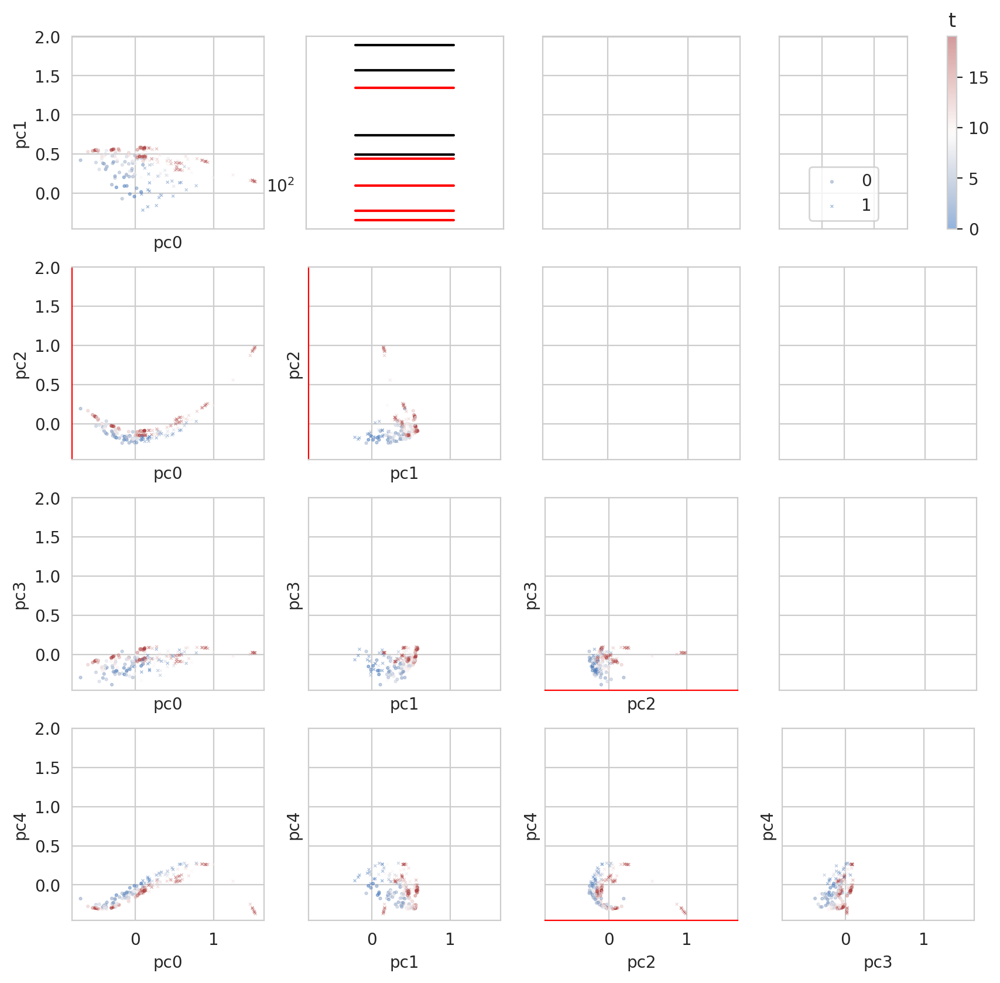

In [27]:
loc = 'inpca_results'
fn = 'yvh_new_subset_18_15'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

# triplot(dc, r, d=5, key='viserr', queries=[0, 1], ckey='m', cdict=mdict, cmap='Set1', evals=True)

triplot(dc.iloc[get_idx(dc, "opt=='sgdn'& m=='wr-4-8' &bn==True")], r, d=5, key='viserr', queries=[0, 1], ckey='t', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


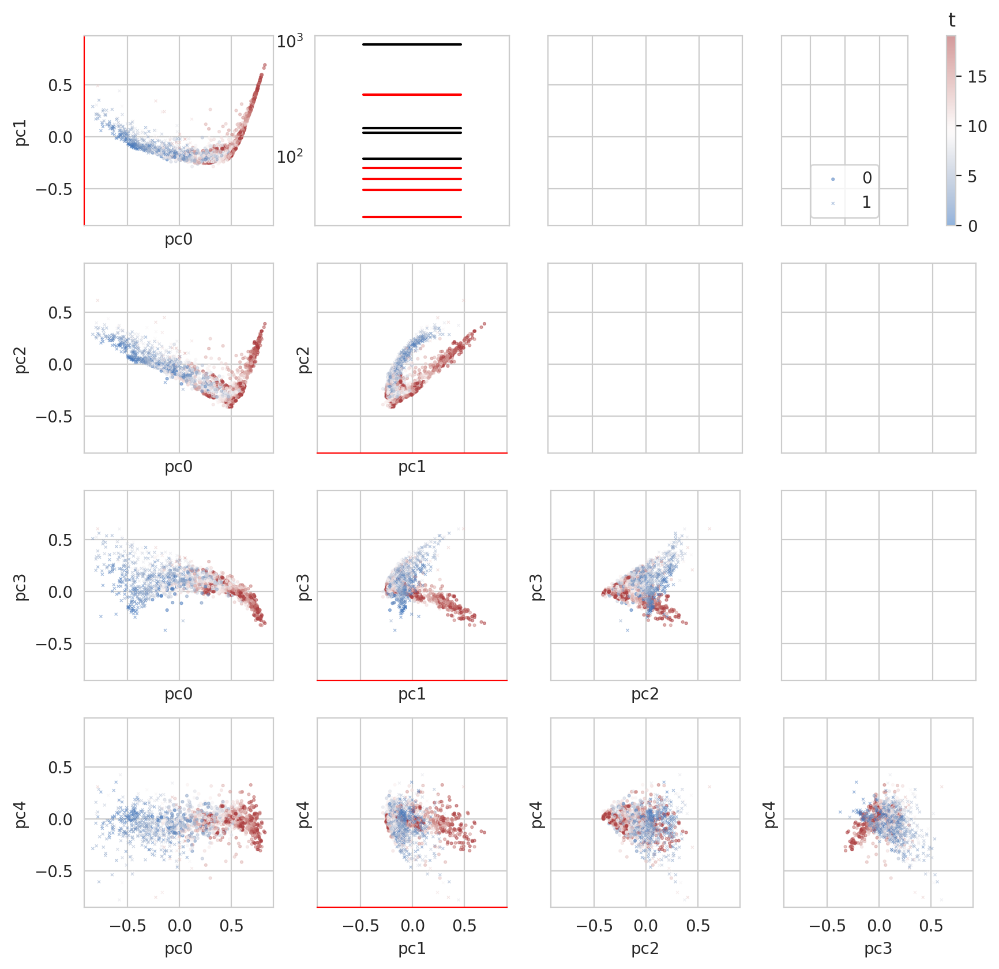

In [28]:
loc = 'inpca_results'
fn = 'yh_new_subset_18_15'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

# triplot(dc, r, d=5, key='iserr', queries=[0, 1], ckey='t', evals=True)
triplot(dc.iloc[get_idx(dc, "bn==True")], r, d=5, key='iserr', queries=[0,1],
        ckey='t', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


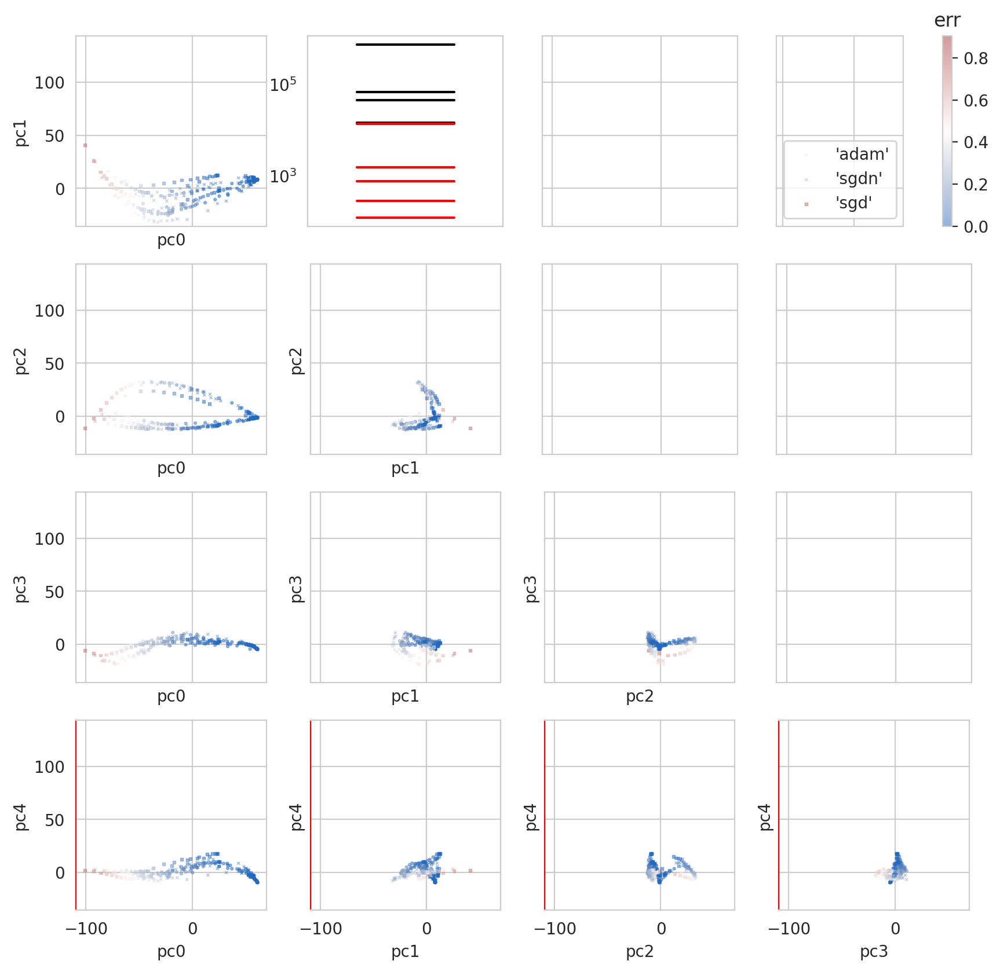

In [29]:
loc = 'inpca_results'
fn = 'yh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='err', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


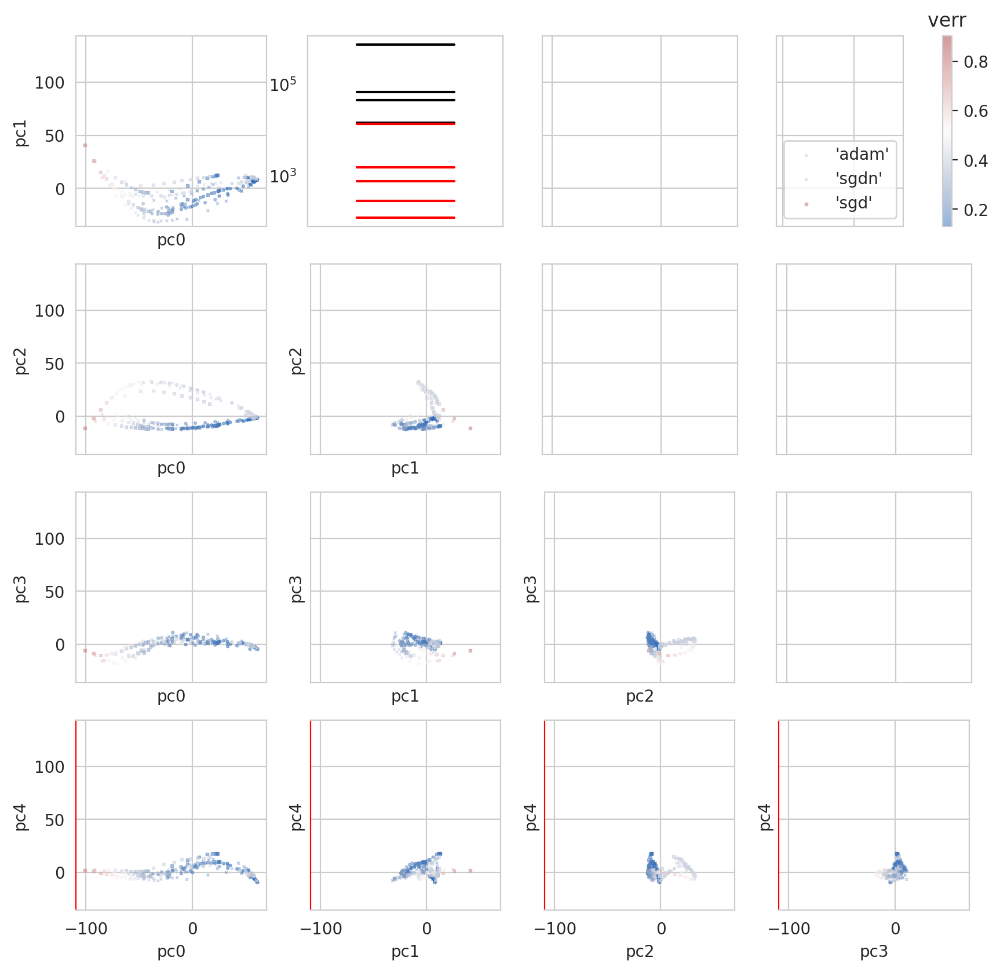

In [30]:
loc = 'inpca_results'
fn = 'yh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='verr', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


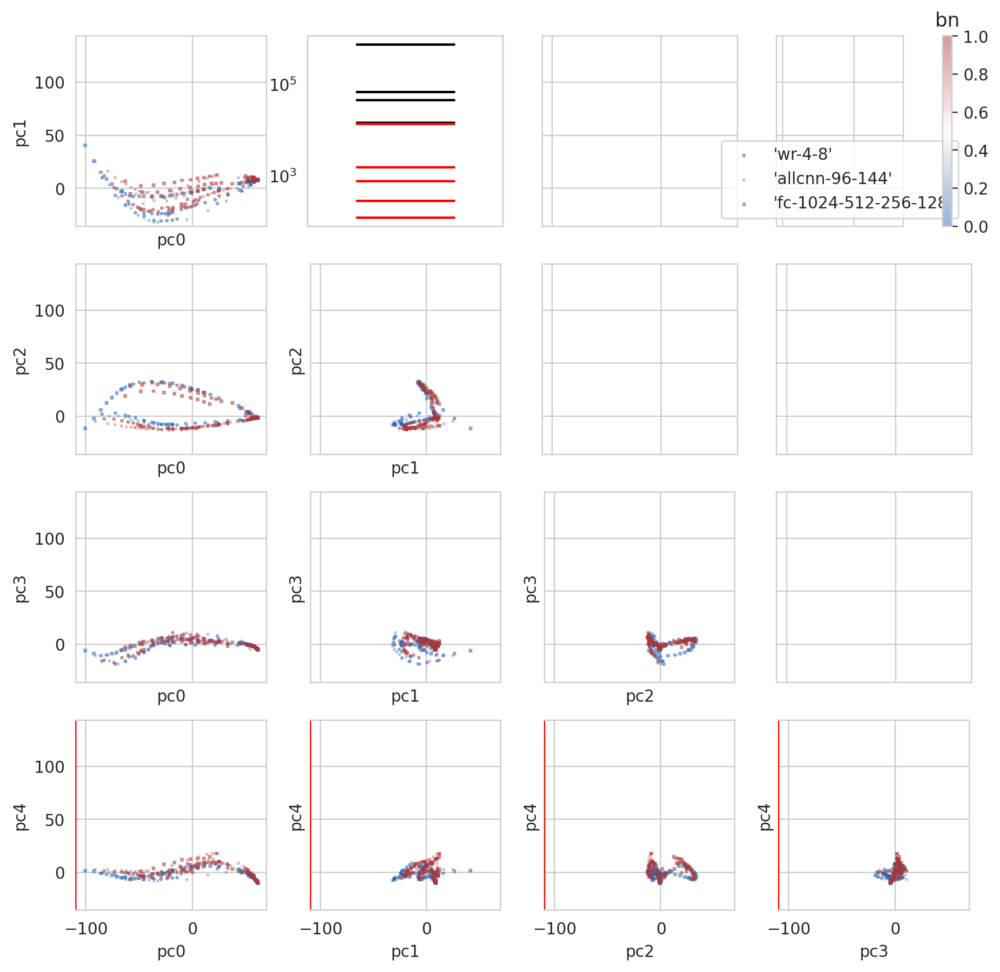

In [31]:
loc = 'inpca_results'
fn = 'yh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='m', queries=models, ckey='bn', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}
{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


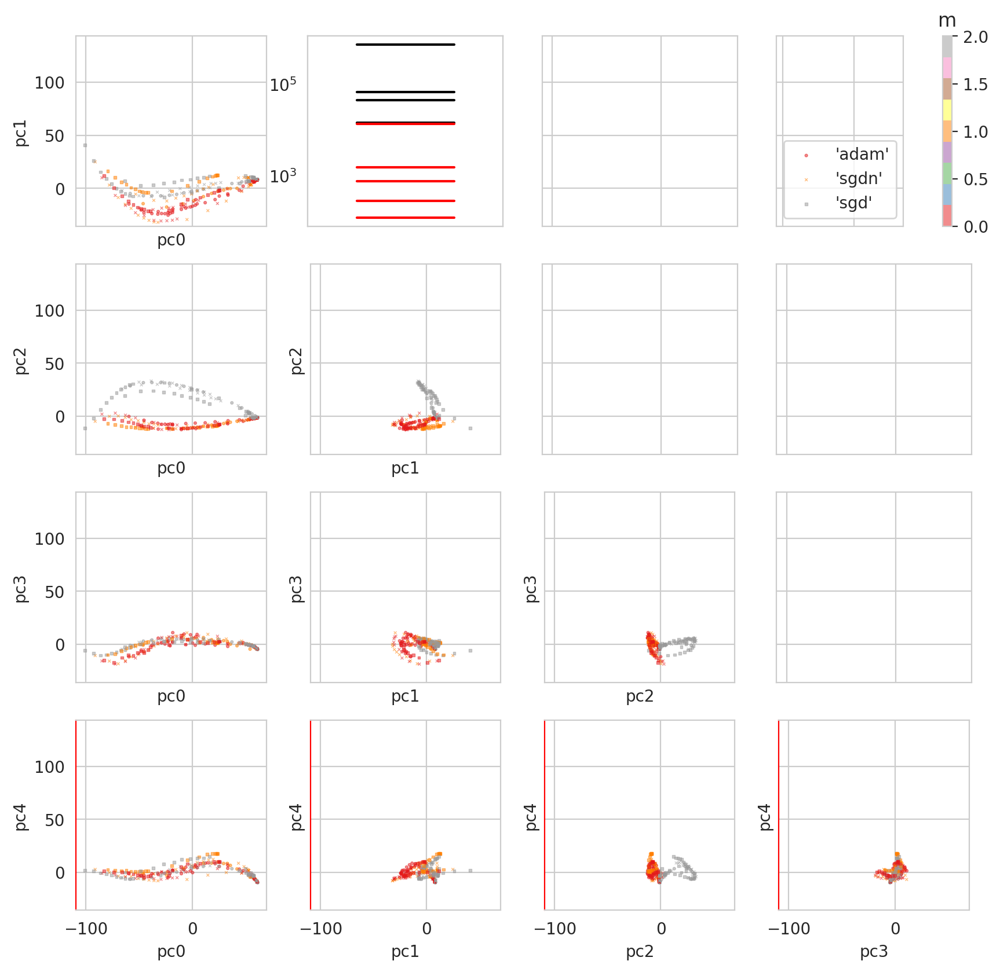

In [32]:
loc = 'inpca_results'
fn = 'yh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


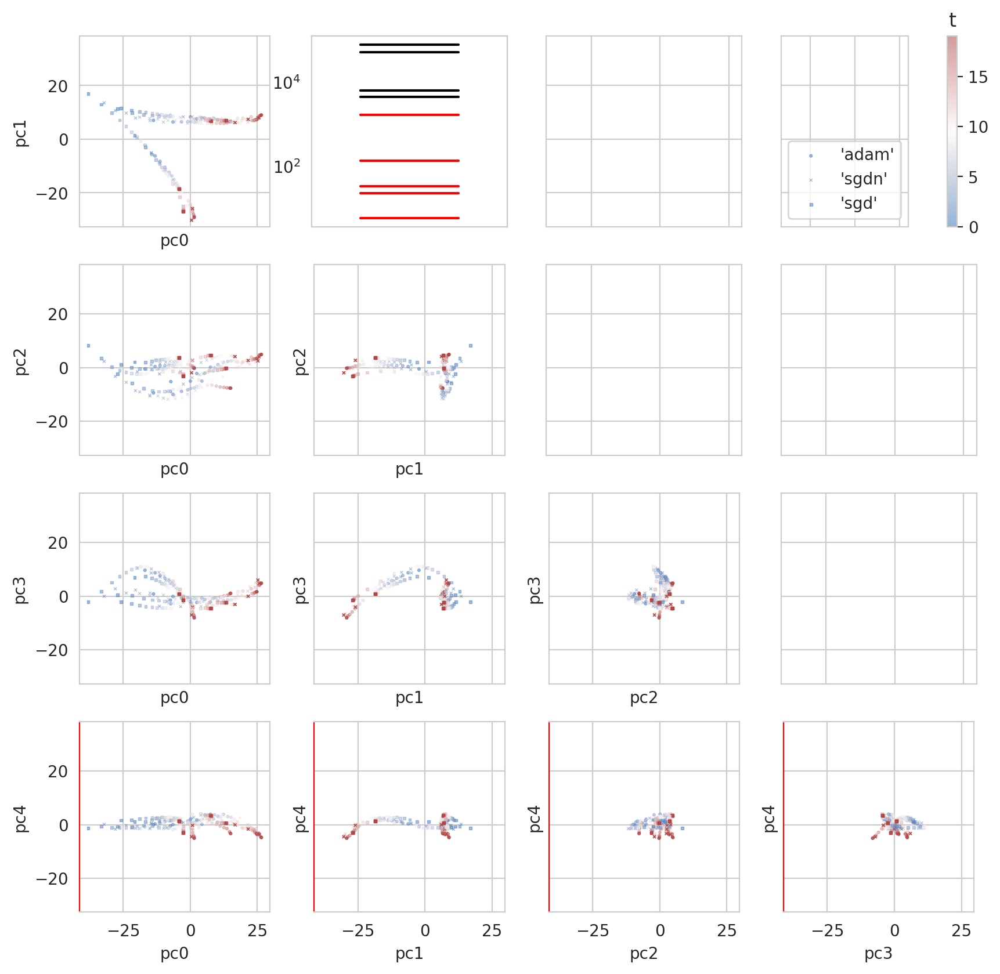

In [34]:
loc = 'inpca_results'
fn = 'yvh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='t', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


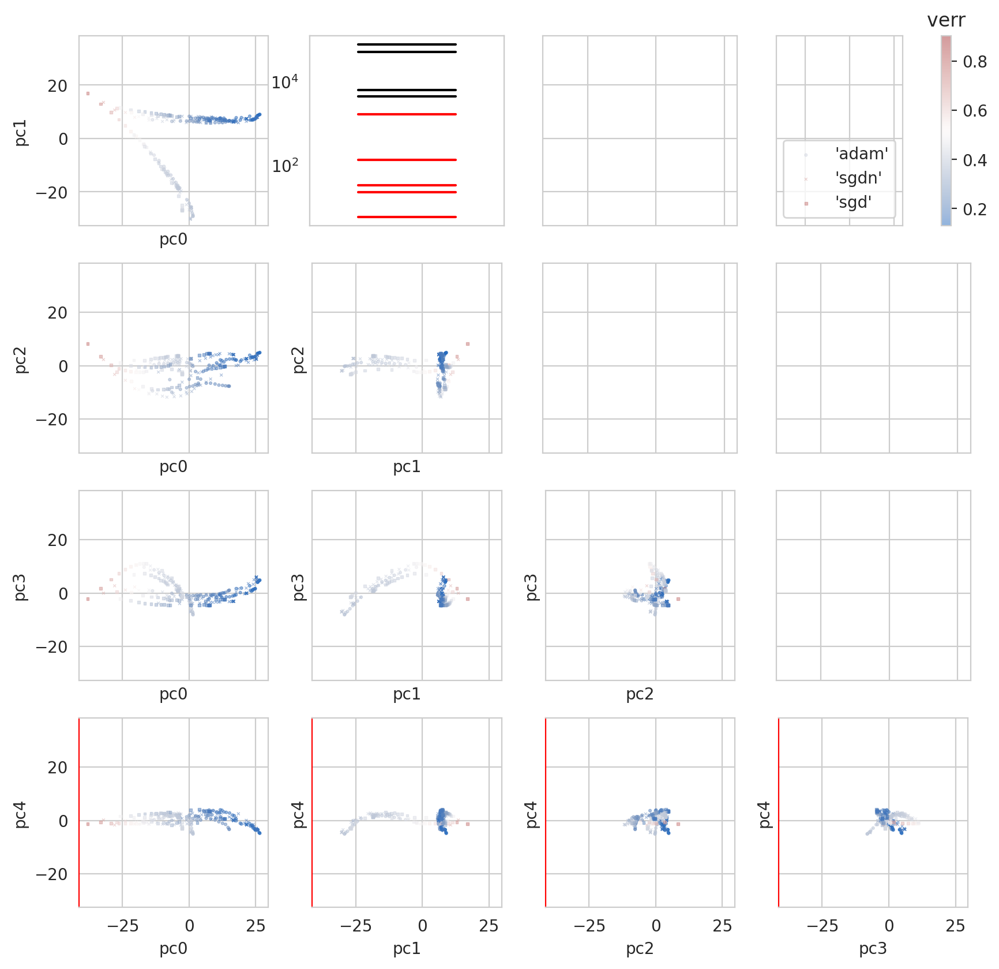

In [35]:
loc = 'inpca_results'
fn = 'yvh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='verr', cmap='vlag', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}
{'wr-4-8': 0, 'allcnn-96-144': 1, 'fc-1024-512-256-128': 2}


/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


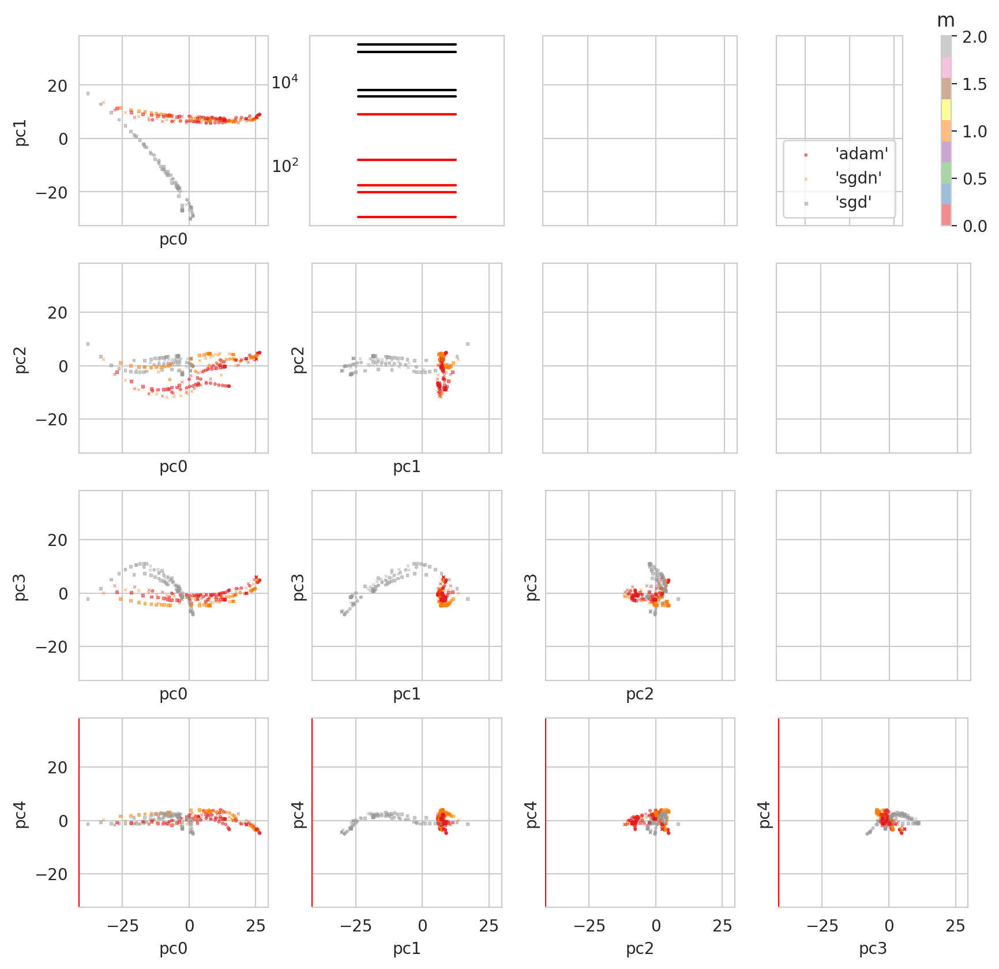

In [36]:
loc = 'inpca_results'
fn = 'yvh_new_avg_filtered'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

triplot(dc, r, d=5, key='opt', queries=opts, ckey='m', cdict=mdict, cmap='Set1', evals=True)
# triplot(dc, r, d=5, key='opt', queries=opts, ckey='err')
print(mdict)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


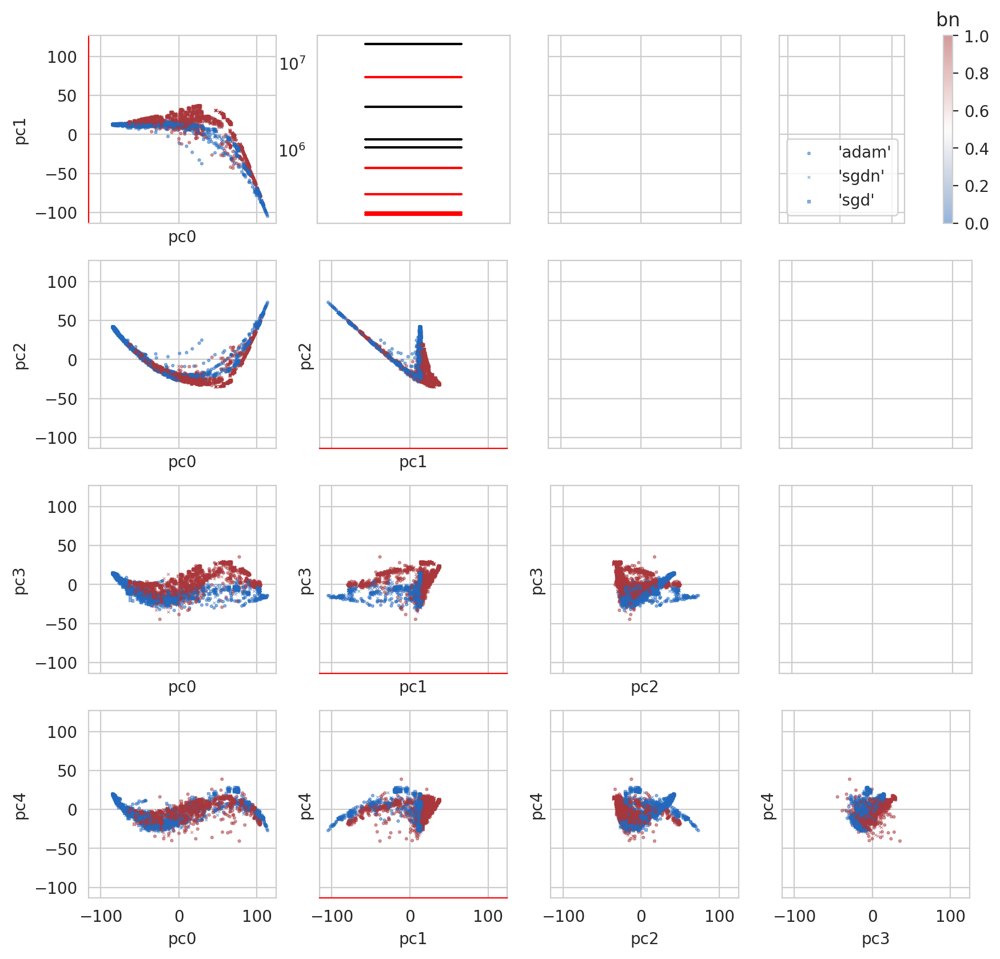

In [37]:
loc = 'inpca_results'
fn = 'yh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]
triplot(dc, r, d=5, key='opt', queries=opts, ckey='bn', cmap='vlag', evals=True)
# triplot(dc, r, d=4, key='m', queries=models, ckey='bn')
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_7683/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


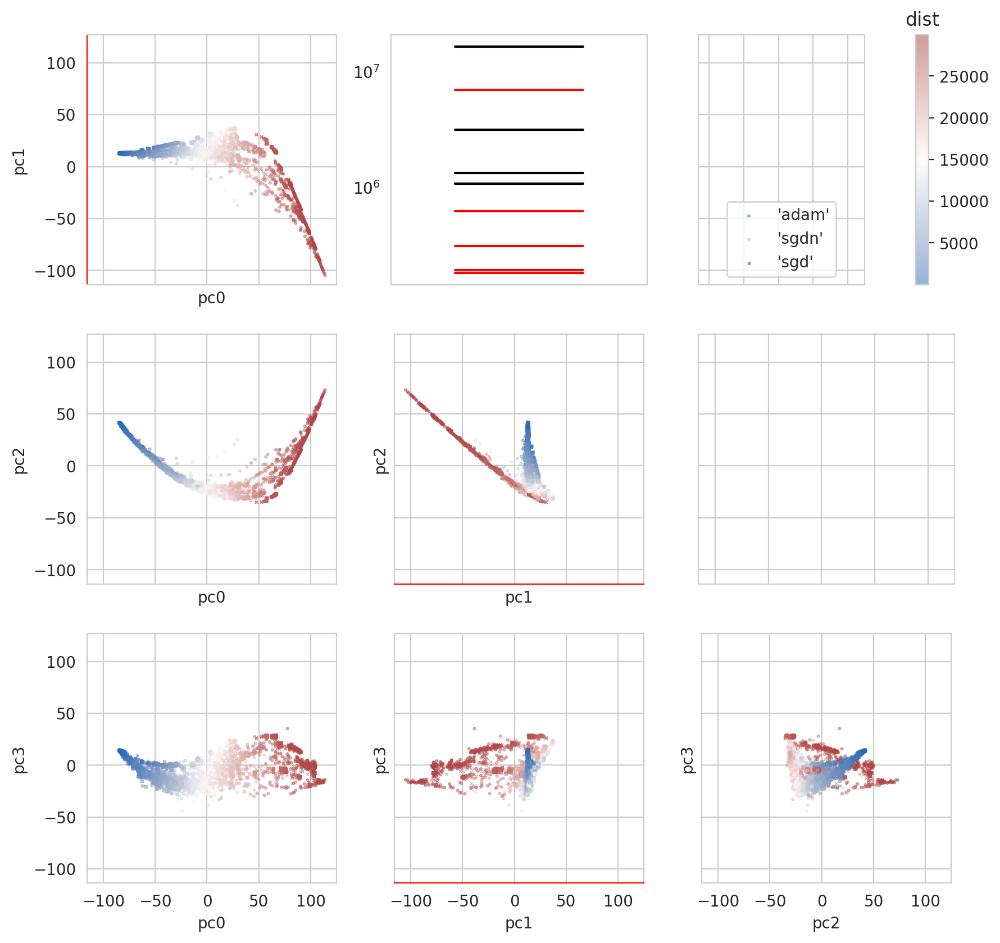

In [5]:
loc = 'inpca_results'
fn = 'yh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]
triplot(dc, r, d=4, key='opt', queries=opts, ckey='dist', cmap='vlag', evals=True)
# triplot(dc, r, d=4, key='m', queries=models, ckey='bn')
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

<IPython.core.display.Javascript object>


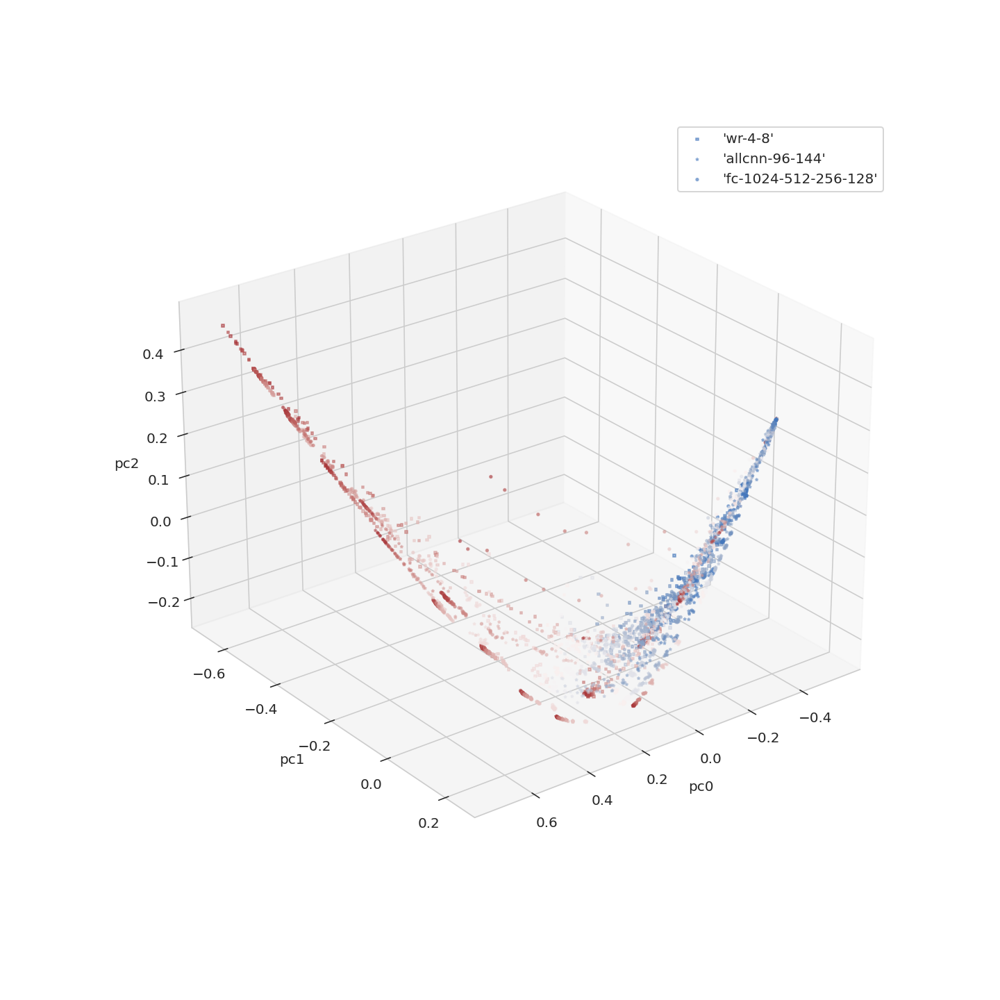

[ 661.85498185 -278.65105771  126.9099403    53.51141283   43.13049402
  -25.10734267  -12.6047222    -7.73002005   -7.3075776 ]


<Axes3DSubplot:xlabel='pc0', ylabel='pc1'>

In [18]:
loc = 'inpca_results'
fn = 'yh_new_all'
%matplotlib notebook
r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]
plot_manifold(dc, r, key='m', queries=models, ckey='t', cmap='vlag')
# triplot(dc, r, d=5, key='m', queries=models, ckey='err', cmap='vlag', evals=True)
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

In [34]:
ii = get_idx(dc, f"t > 0 & m == 'true'")
xx = r['xp'][ii]

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


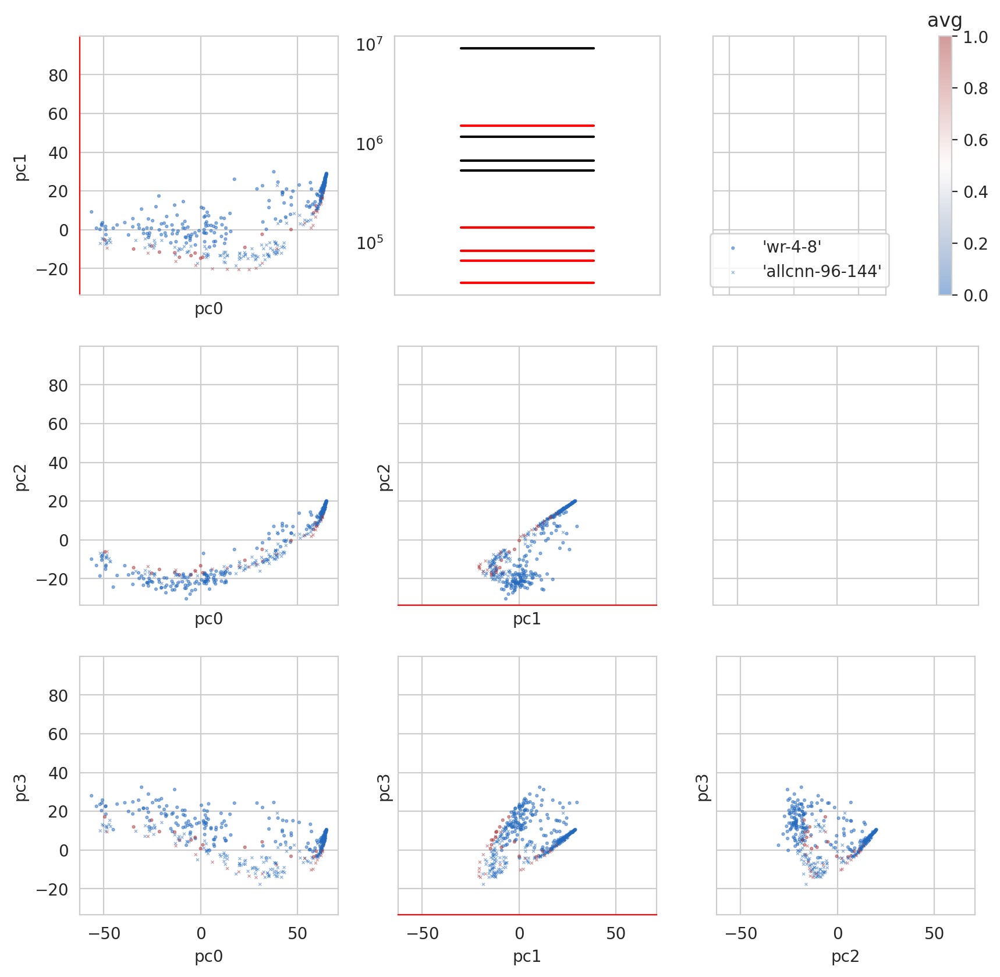

In [40]:
loc = 'inpca_results'
fn = 'yh_new_all_with_avg'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]
dc.at[3080, 't']=19
dc.at[3080, 'avg']=0

triplot(dc.iloc[get_idx(dc,"bn==True & opt=='adam'")], r, d=4, key='m', 
        queries=["'wr-4-8'", "'allcnn-96-144'"], ckey='avg', evals=True)
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


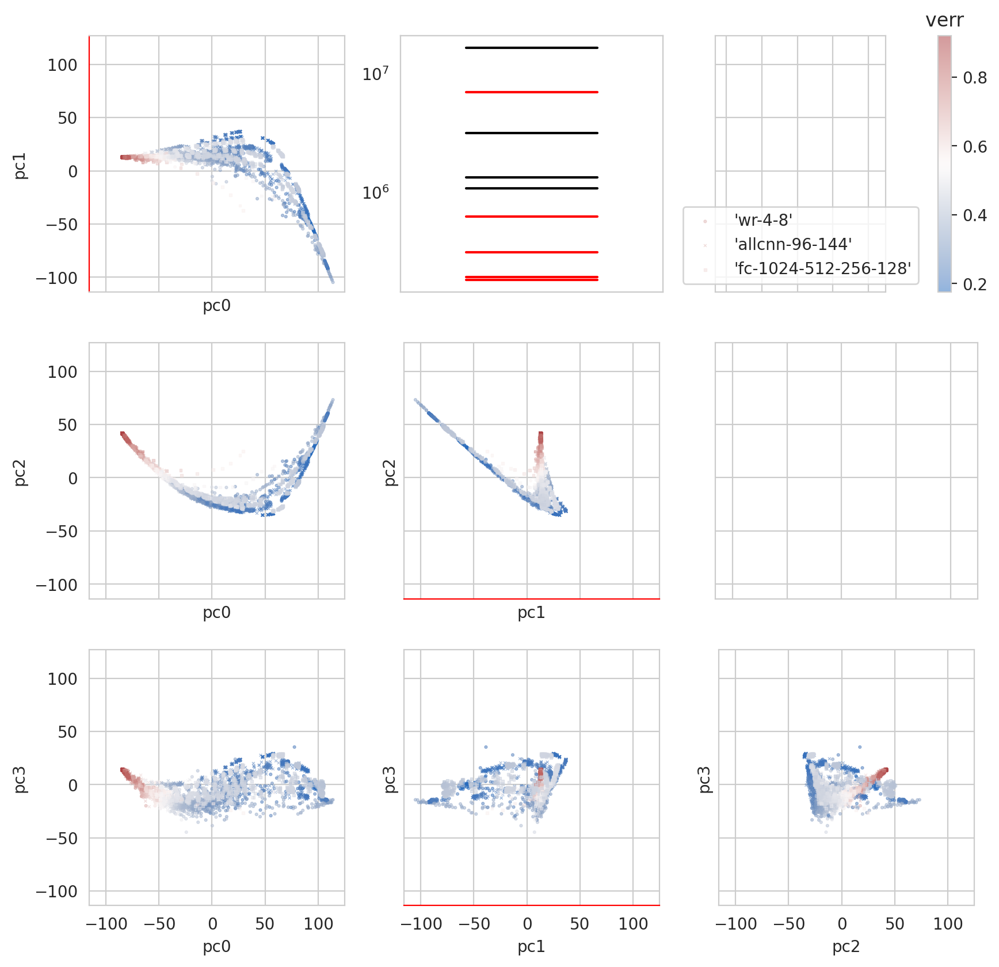

In [41]:
loc = 'inpca_results'
fn = 'yh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]

triplot(dc, r, d=4, key='m', queries=models, ckey='verr', evals=True)
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


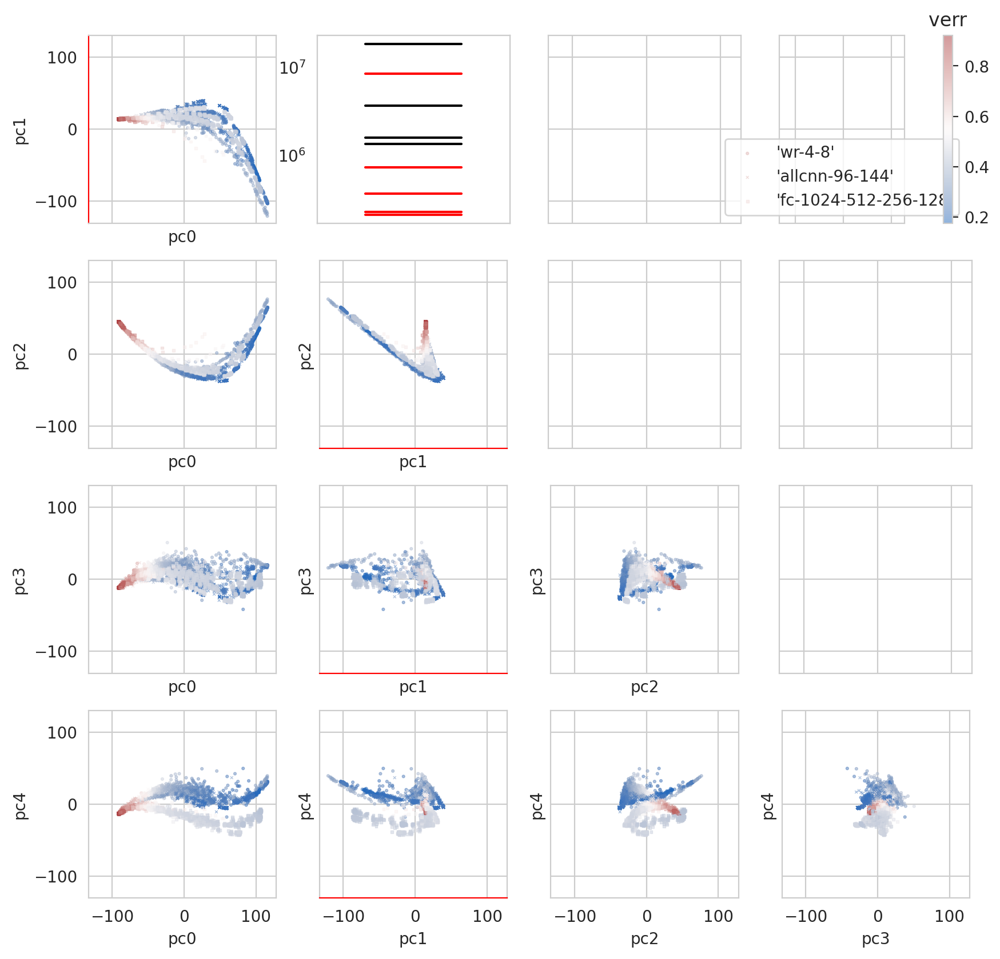

In [42]:
loc = 'inpca_results'
fn = "['yh', 'yvh']_new_all"

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
# w = th.load(os.path.join(loc, 'w_%s.p'%fn))
# dc['dist'] = w[0]

triplot(dc, r, d=5, key='m', queries=models, ckey='verr', evals=True)

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


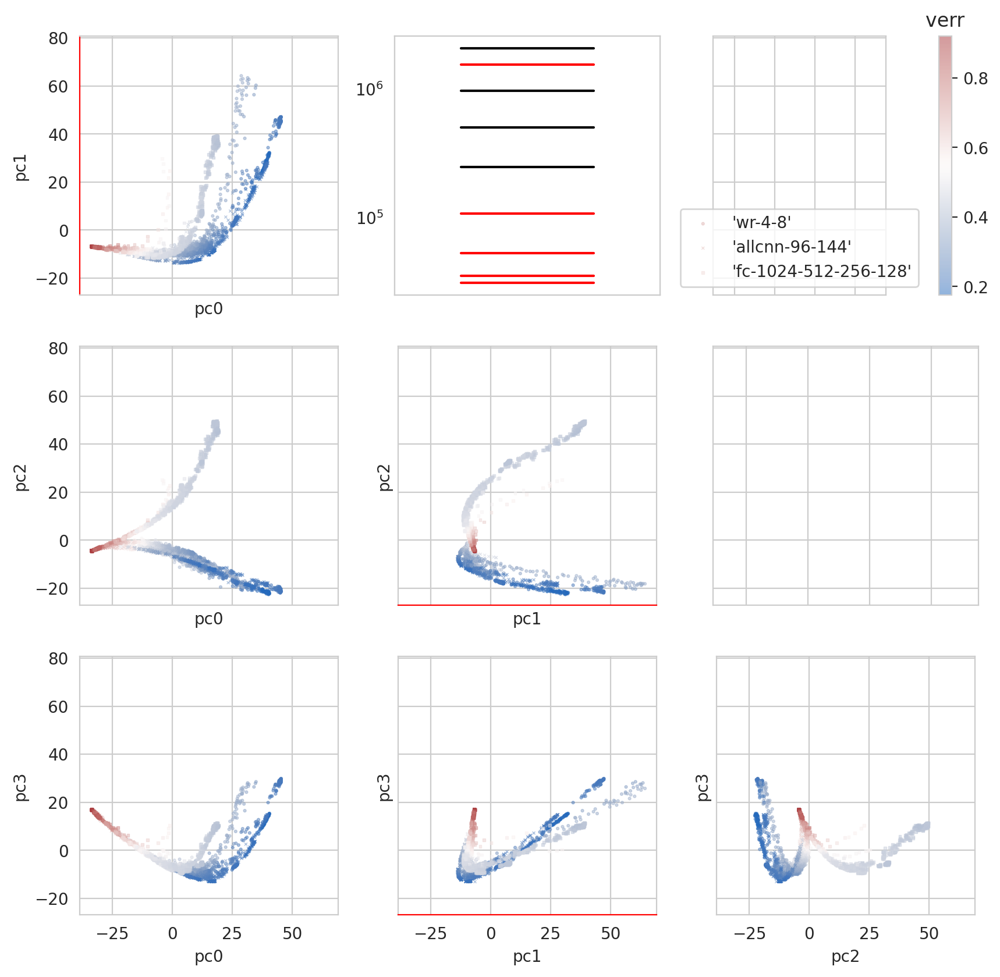

In [43]:
loc = 'inpca_results'
fn = 'yvh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]

triplot(dc, r, d=4, key='m', queries=models, ckey='verr', evals=True)
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

In [44]:
from matplotlib.colors import Normalize

markers = ['s', '*', 'o', 'x']
def avg_plot(dc, r, d=3, configs=["opt == 'adam'"], cmap='vlag', tri=False,
             mkey='', mdict=None, ckey='', cdict=None, evals=False):
    """_summary_
    Given projection, average over configs.
    """
    ee = r['e']
    print(ee)

    if tri:
        figs, axs = plt.subplots(
            d-1, d-1, figsize=(10, 10), sharex=True, sharey=True)
    else:
        fig = plt.figure(1, figsize=(10, 10))
        plt.clf()
        ax = fig.add_subplot(projection='3d')
    if len(configs) <= 5 or mkey:
        markers = ["o", "^", "s", "*", "+"]
    if ckey:
        dcc = dc[ckey]
        if cdict:
            dcc = dcc.map(cdict)
        normalize = Normalize(vmin=dcc.min(), vmax=dcc.max())
    for i, cond in enumerate(configs):
        idxs = [get_idx(dc, f't == {t} & {cond}') for t in range(1, 20)]
        xx = np.stack([np.mean(r['xp'][ii], axis=0) for ii in idxs])
        if ckey:
            c = np.stack([np.mean(dcc[ii], axis=0) for ii in idxs])
            c = plt.cm.get_cmap(cmap)(normalize(c))
        else:
            c = np.repeat([plt.cm.get_cmap(cmap)(
                i/len(configs))], len(xx), axis=0)

        if len(configs) <= 5:
            m = markers[i]
        elif mkey:
            m = mdict[dc[mkey][idxs[0]].iloc[0]]
        else:
            m = 'o'
        if tri:
            for (i1, d1) in enumerate(range(d-1)):
                for (i2, d2) in enumerate(range(d1+1, d)):
                    ax = axs[d2-1, d1]
                    ax.axis("square")
                    sc = ax.scatter(xx[:, d1], xx[:, d2],
                                    edgecolors=c, facecolors="none",
                                    s=5, label=cond, marker=m)
                    ax.set_xlabel(f'pc{d1}')
                    ax.set_ylabel(f'pc{d2}')
        else:
            sc = ax.scatter(xx[:, 0], xx[:, 1], xx[:, 2],
                            edgecolors=c, facecolors="none", marker=m,
                            s=5, label=cond)
    handles, labels = ax.get_legend_handles_labels()
    if tri:
        ax = axs[0, -1]
        ax.legend(handles, labels, loc='upper right')

        if evals:
            ax = figs.add_subplot(d-1, d-1, (d-1)**2-1)
            ax.set_yscale('log')
            ax.grid()
            w = 0.5
            for e in ee:
                ax.plot((-w/4, w/4), (np.abs(e), np.abs(e)),
                        c='k' if e > 0 else 'r')
            ax.set_xlim([-w/2, w/2])
            ax.get_xaxis().set_visible(False)
    else:
        ax.legend(handles, labels, loc='lower center',
                  bbox_to_anchor=(1.0, 0.5))


[16546374.54334358 -6966276.44075782  3172748.50706984  1337785.32099094
  1078262.35099759  -627683.56663307  -315118.05490872  -193250.5013437
  -182689.44007045]


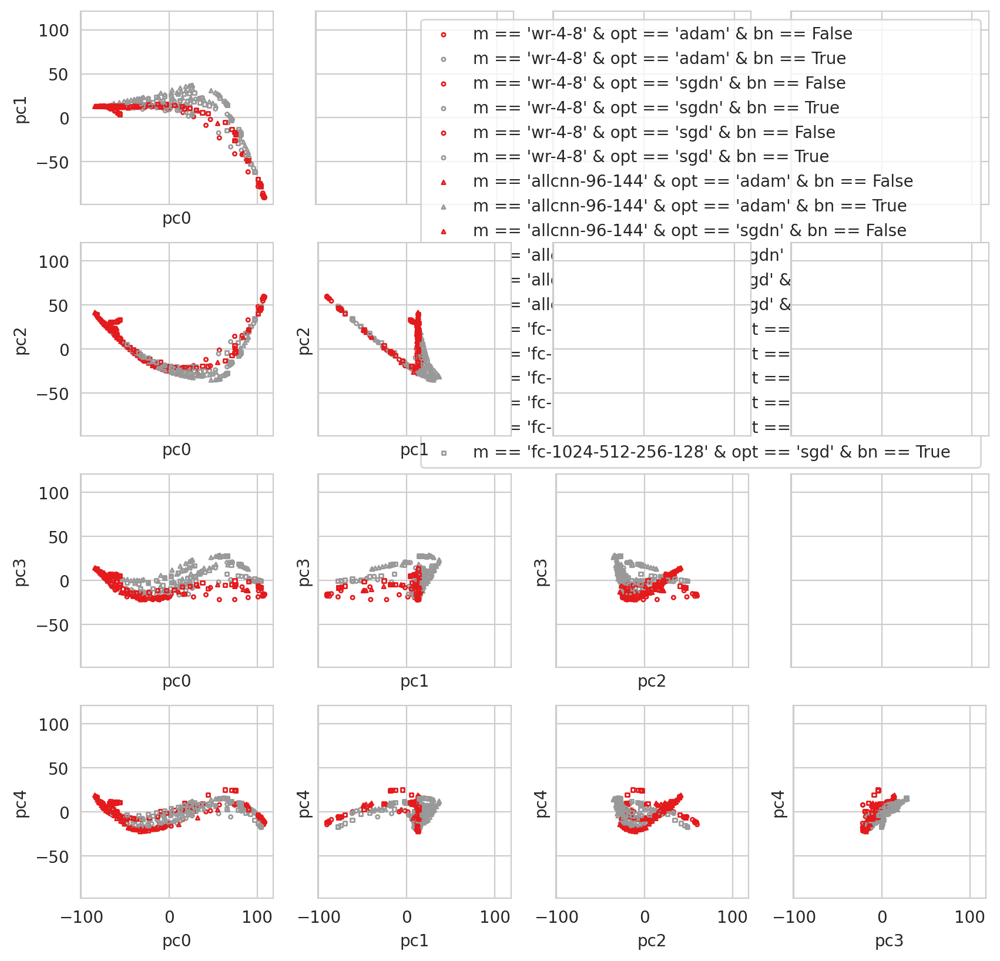

In [45]:
loc = 'inpca_results'
fn = 'yh_new_all'
markers = ["o", "^", "s", "*", "+"]
bns=[False, True]
configs = [f"m == {m} & opt == {o} & bn == {bn}" for (m, o, bn) in product(models, opts, bns)]

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=configs, cmap='Set1', tri=True, ckey='bn',  evals=False,
         mkey='m', mdict={m.strip("''"): markers[i] for (i, m) in enumerate(models)})  

[16546374.54334358 -6966276.44075782  3172748.50706984  1337785.32099094
  1078262.35099759  -627683.56663307  -315118.05490872  -193250.5013437
  -182689.44007045]


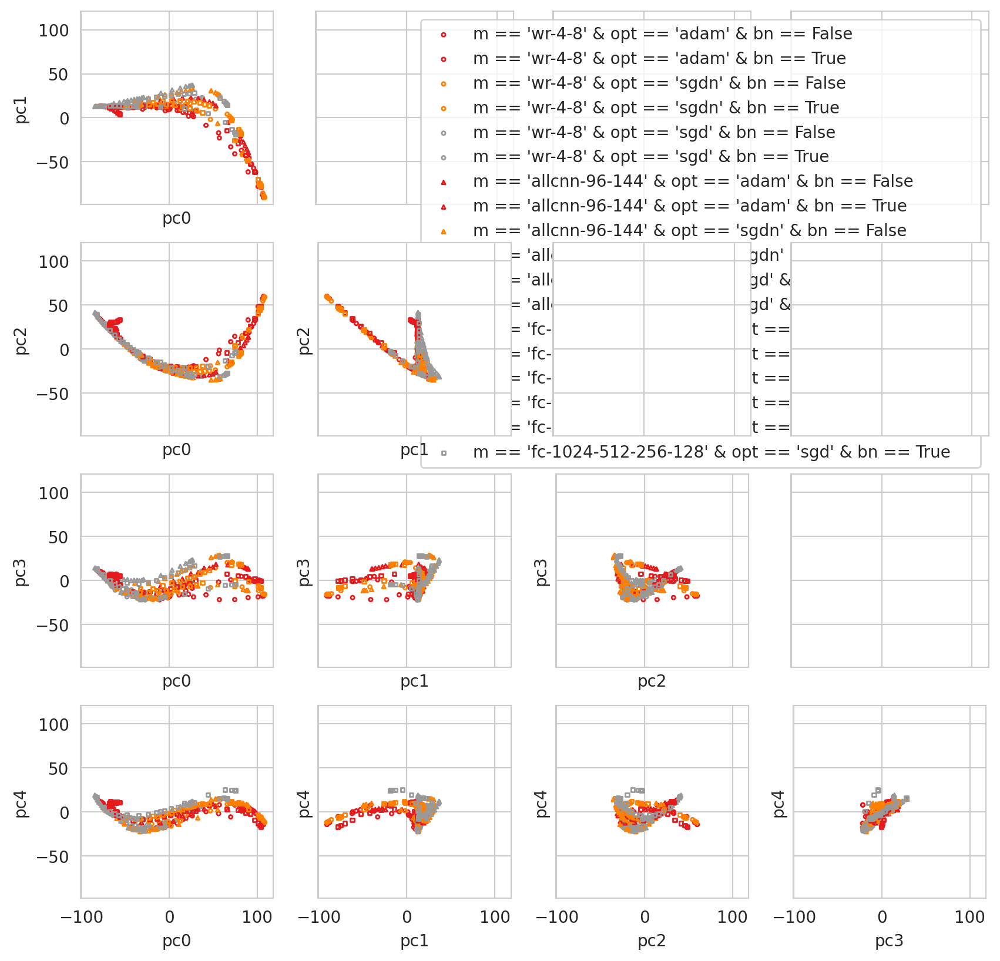

In [46]:
loc = 'inpca_results'
fn = 'yh_new_all'

configs = [f"m == {m} & opt == {o} & bn == {bn}" for (m, o, bn) in product(models, opts, bns)]

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=configs, cmap='Set1', tri=True, ckey='opt', cdict=odict, evals=False,
        mkey='m', mdict={m.strip("''"): markers[i] for (i, m) in enumerate(models)})  

[ 2084572.62050781 -1548350.66708974   973067.35792666   503643.19833245
   246418.54790737  -107251.92886547   -52539.09377676   -35239.69699845
   -30903.50383444]


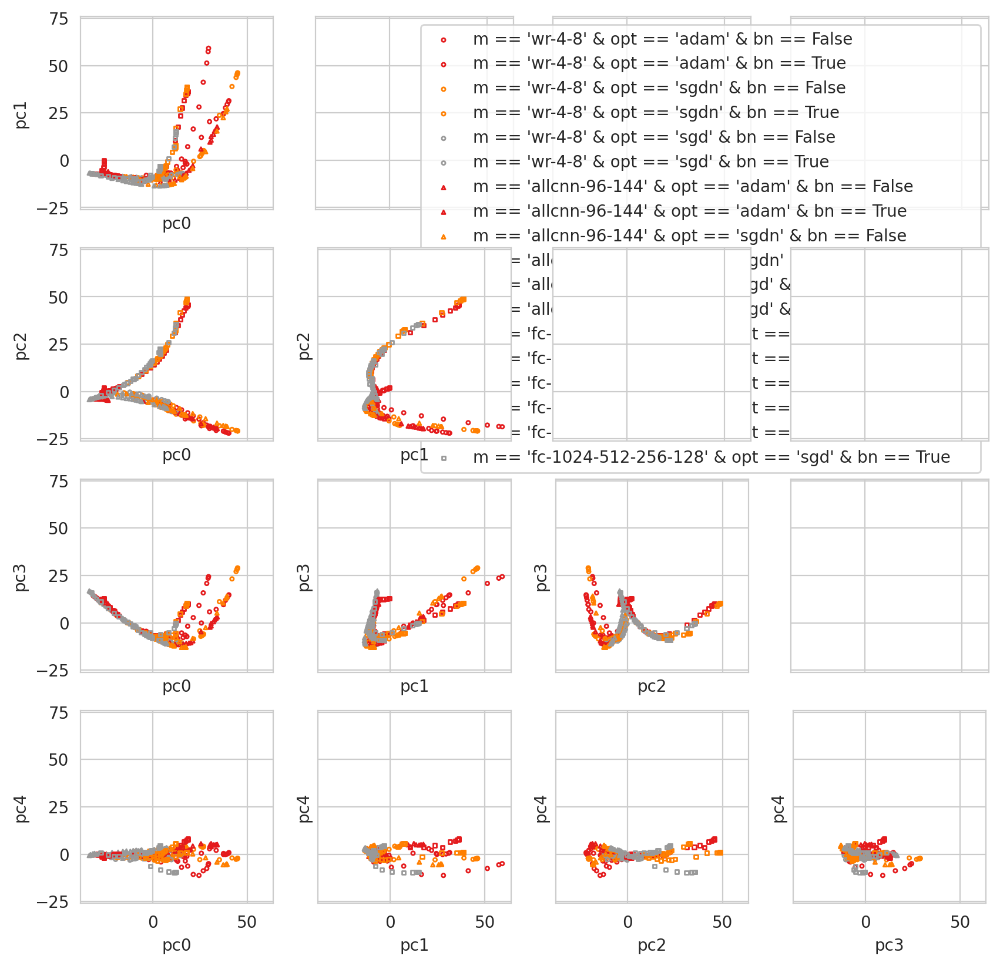

In [47]:
loc = 'inpca_results'
fn = 'yvh_new_all'

configs = [f"m == {m} & opt == {o} & bn == {bn}" for (m, o, bn) in product(models, opts, bns)]

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=configs, cmap='Set1', tri=True, ckey='opt', cdict=odict, evals=False,
        mkey='m', mdict={m.strip("''"): markers[i] for (i, m) in enumerate(models)})  

[ 2084572.62050781 -1548350.66708974   973067.35792666   503643.19833245
   246418.54790737  -107251.92886547   -52539.09377676   -35239.69699845
   -30903.50383444]


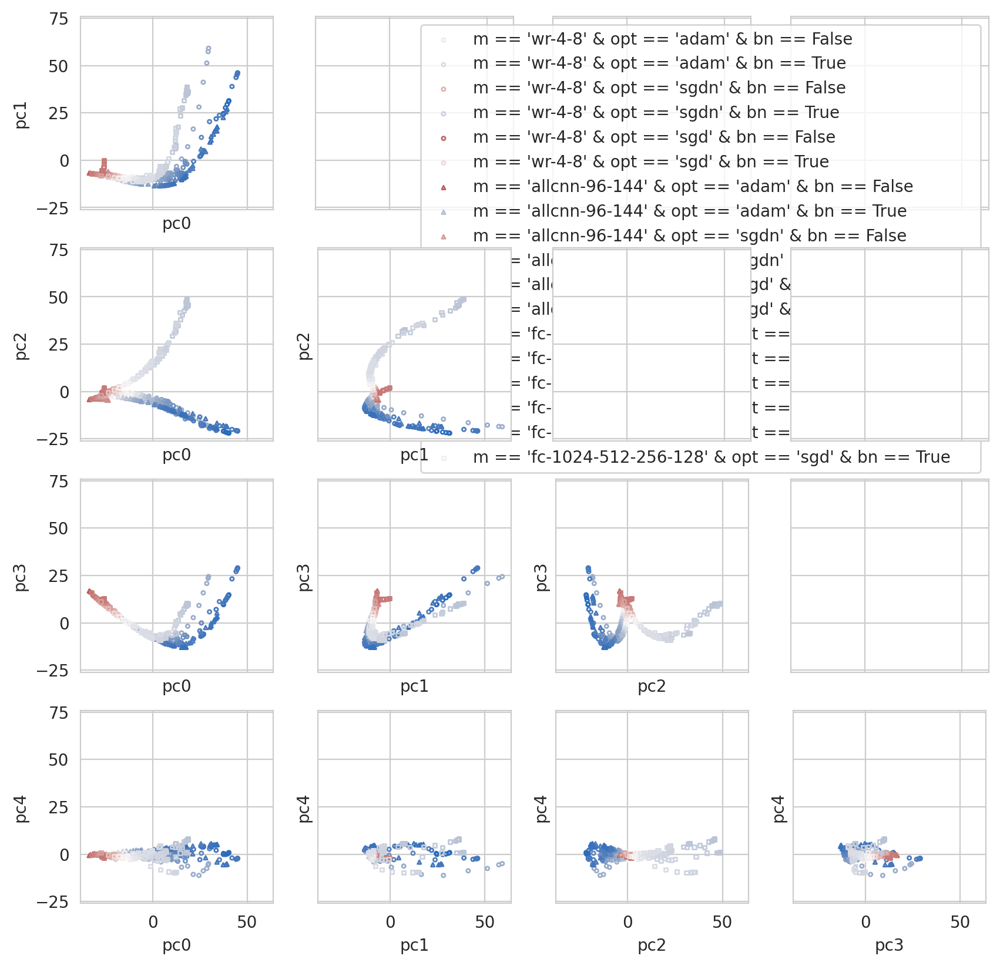

In [48]:
loc = 'inpca_results'
fn = 'yvh_new_all'

configs = [f"m == {m} & opt == {o} & bn == {bn}" for (m, o, bn) in product(models, opts, bns)]

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=configs, cmap='vlag', tri=True, ckey='verr', evals=False,
        mkey='m', mdict={m.strip("''"): markers[i] for (i, m) in enumerate(models)})  

[16546374.54334358 -6966276.44075782  3172748.50706984  1337785.32099094
  1078262.35099759  -627683.56663307  -315118.05490872  -193250.5013437
  -182689.44007045]


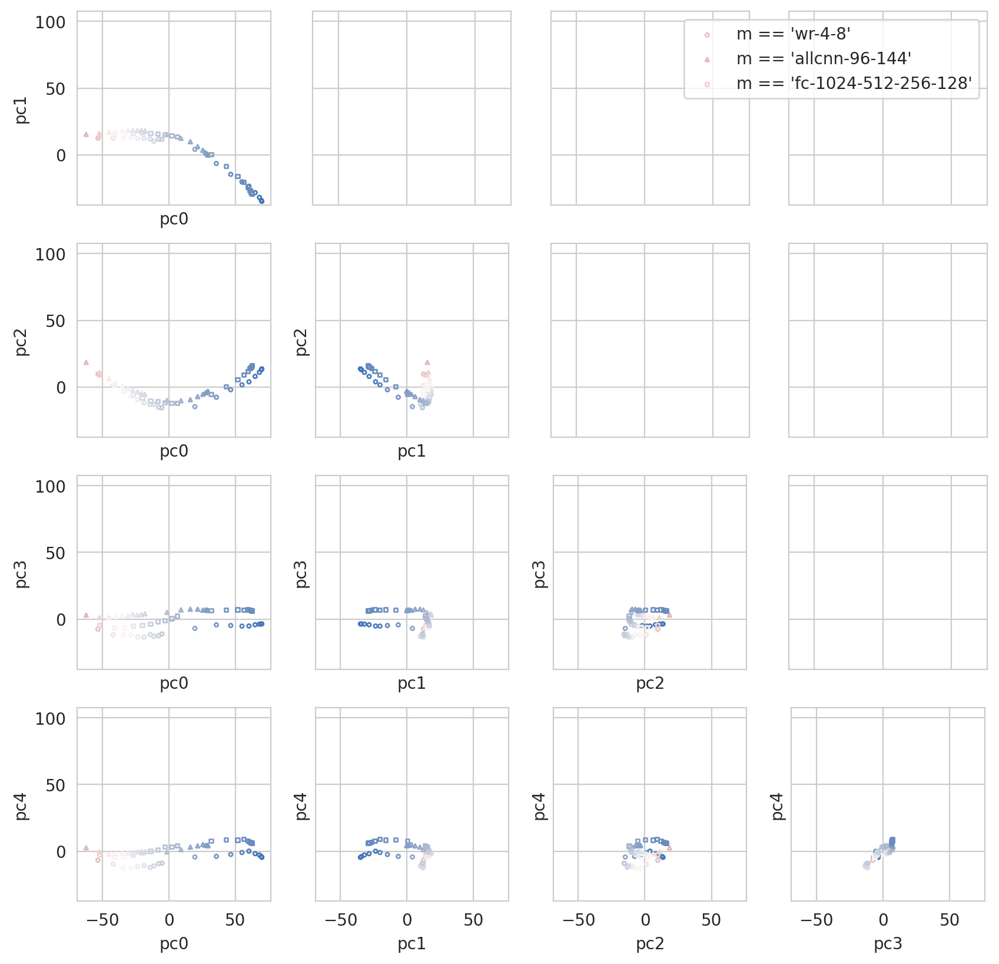

In [49]:
loc = 'inpca_results'
fn = 'yh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=[f"m == {m}" for m in models], cmap='vlag', tri=True, ckey='err')  

[16546374.54334358 -6966276.44075782  3172748.50706984  1337785.32099094
  1078262.35099759  -627683.56663307  -315118.05490872  -193250.5013437
  -182689.44007045]


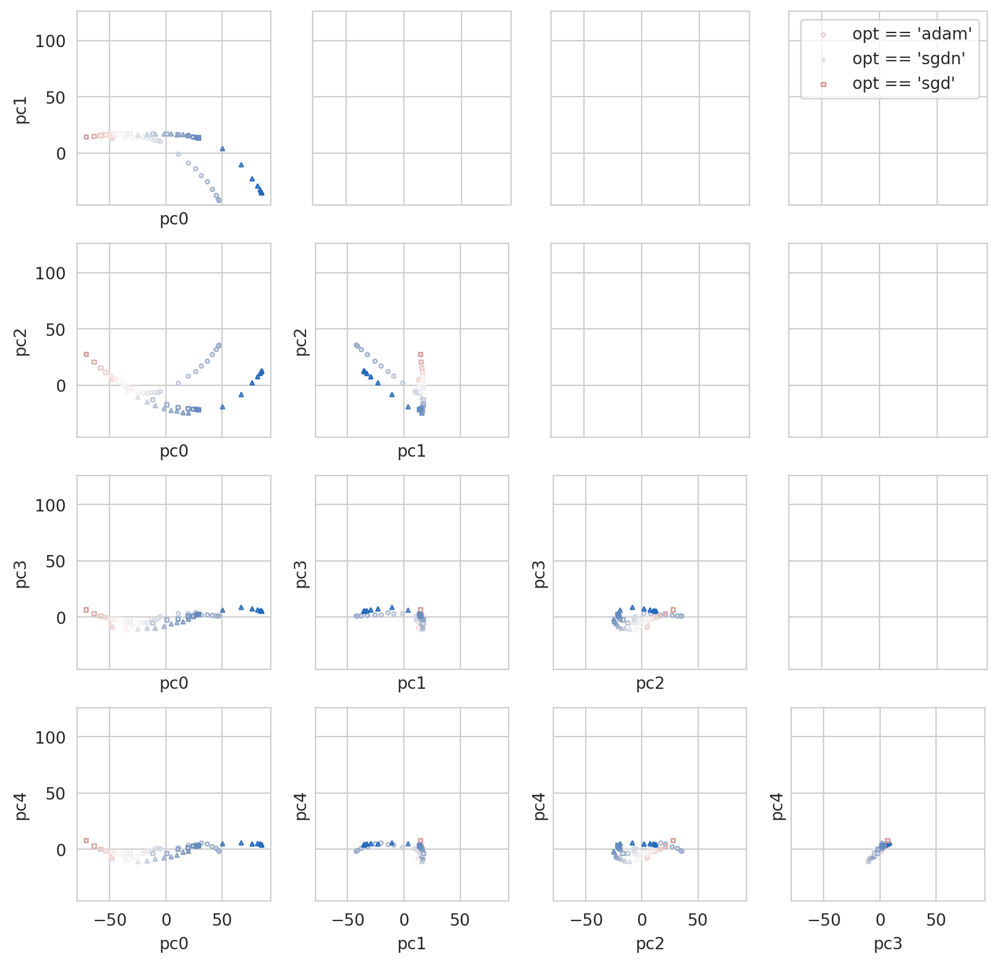

In [50]:
loc = 'inpca_results'
fn = 'yh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=[f"opt == {o}" for o in opts], cmap='vlag', tri=True, ckey='err')  

[ 2084572.62050781 -1548350.66708974   973067.35792666   503643.19833245
   246418.54790737  -107251.92886547   -52539.09377676   -35239.69699845
   -30903.50383444]


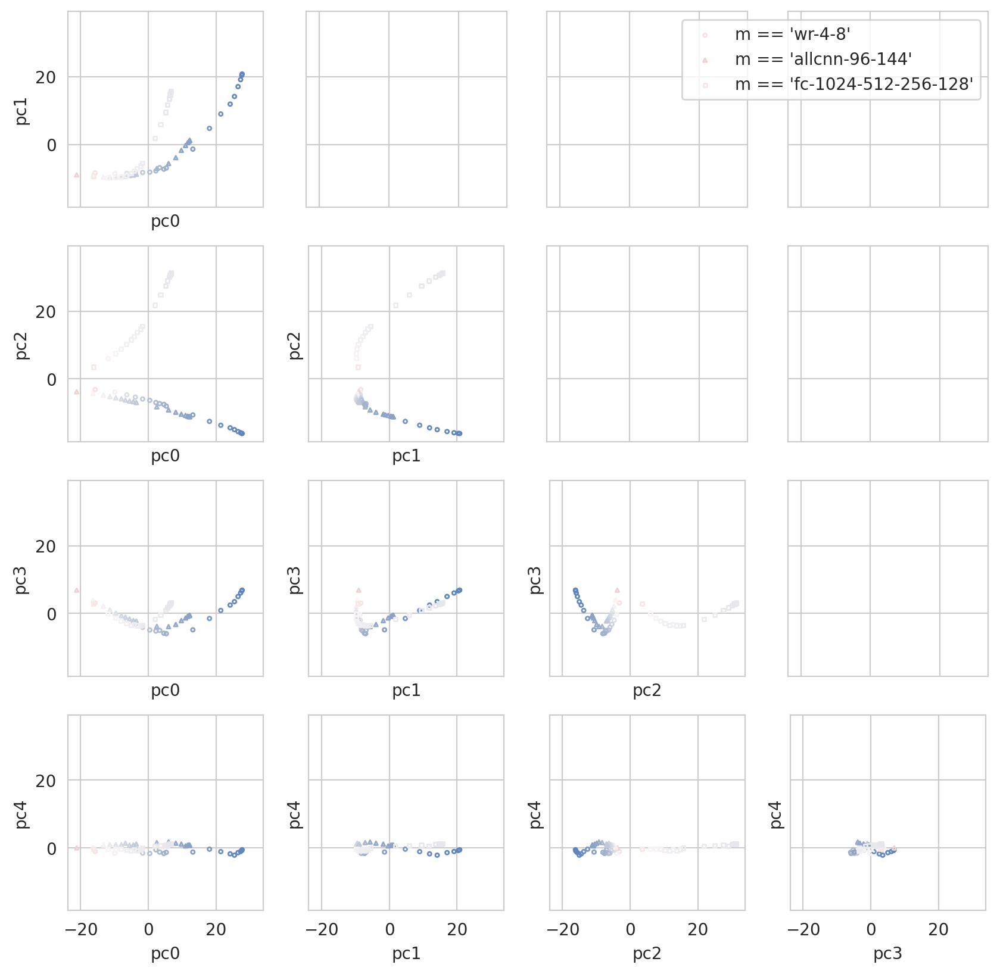

In [51]:
loc = 'inpca_results'
fn = 'yvh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=[f"m == {m}" for m in models], cmap='vlag', tri=True,  ckey='verr')  

[ 2084572.62050781 -1548350.66708974   973067.35792666   503643.19833245
   246418.54790737  -107251.92886547   -52539.09377676   -35239.69699845
   -30903.50383444]


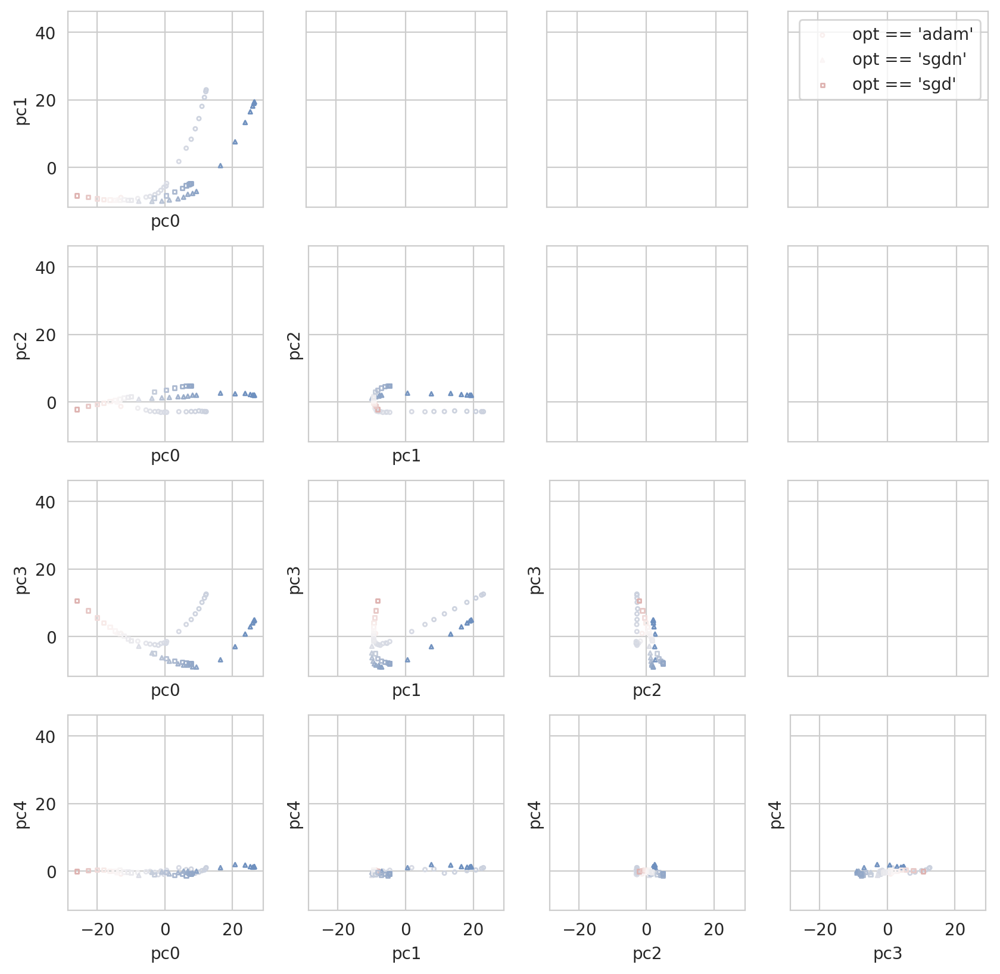

In [52]:
loc = 'inpca_results'
fn = 'yvh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
avg_plot(dc, r, d=5, configs=[f"opt == {o}" for o in opts], cmap='vlag', tri=True,  ckey='verr')  

/tmp/ipykernel_5195/2583246618.py:86: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2, ax=ax);


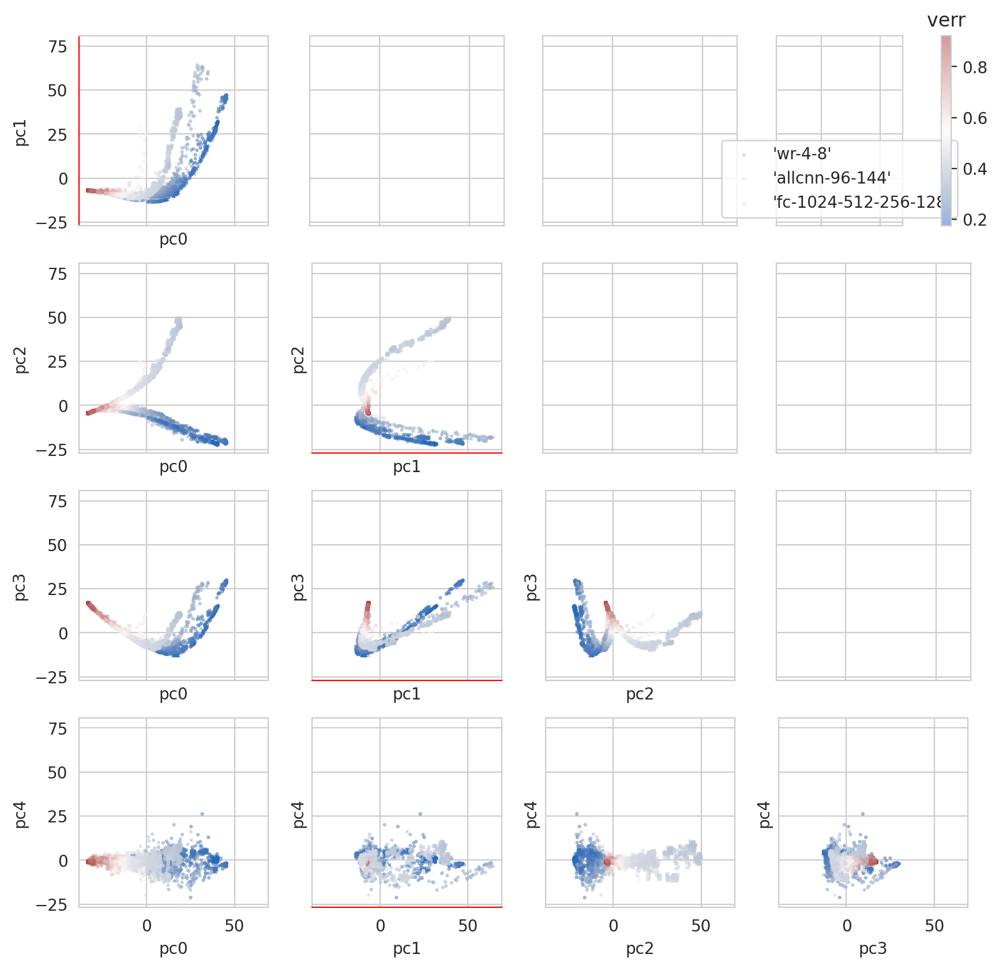

In [53]:
loc = 'inpca_results'
fn = 'yvh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
w = th.load(os.path.join(loc, 'w_%s.p'%fn))
dc['dist'] = w[0]

triplot(dc, r, d=5, key='m', queries=models, ckey='verr')
# plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

[ 2084572.62050781 -1548350.66708974   973067.35792666   503643.19833245
   246418.54790737  -107251.92886547   -52539.09377676   -35239.69699845
   -30903.50383444]


/tmp/ipykernel_5195/2583246618.py:33: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  clb=plt.colorbar(sc, pad=0.2);


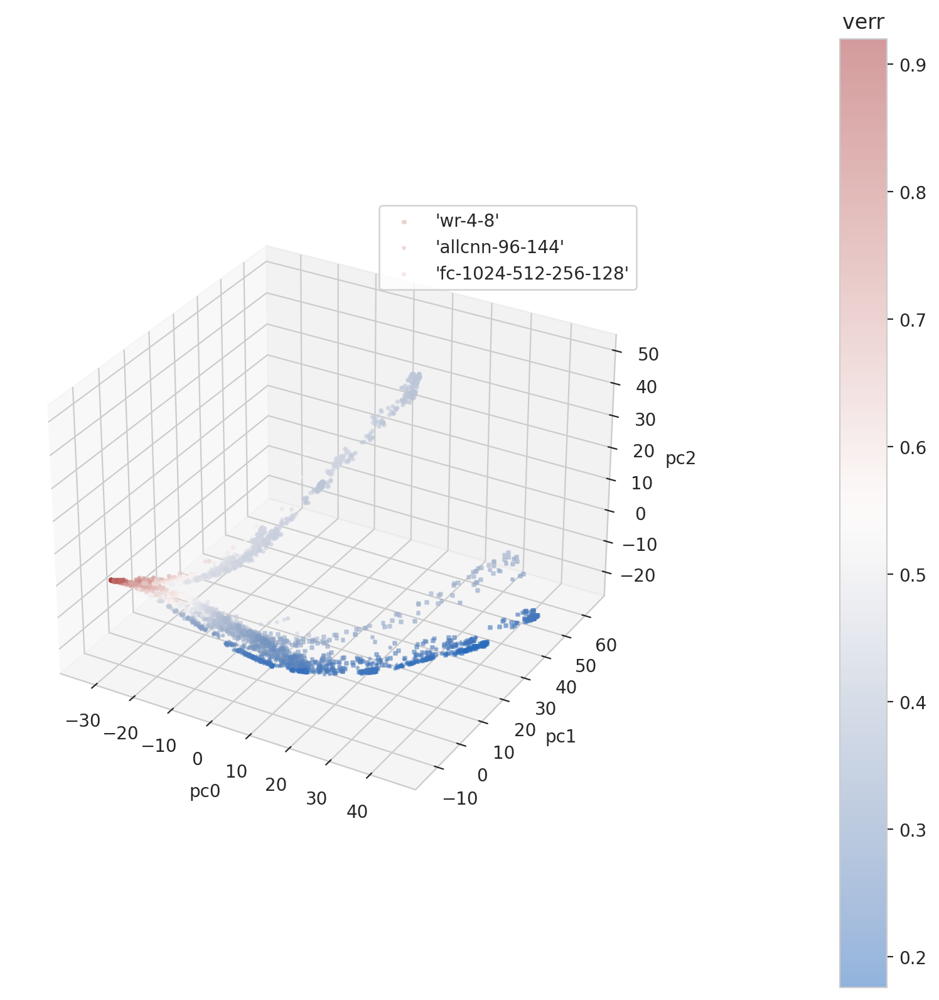

In [54]:
loc = 'inpca_results'
fn = 'yvh_new_all'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

ax = plot_manifold(dc, r, dims=[0,1,2], key='m', 
                   queries=models,
                   ckey='verr')

In [177]:
plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_25450/275706390.py:1: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(f'{fn}_triplot.pdf', bbox_inches='tight', rasterized=True)


<AxesSubplot:xlabel='t', ylabel='verr'>

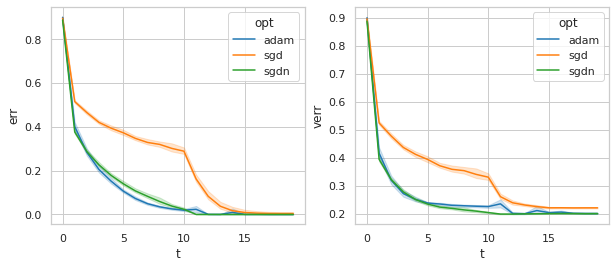

In [62]:
ii = get_idx(dc, "bn == True & m == 'allcnn-96-144'")
fig, axes = plt.subplots(1,2, figsize=(10, 4))
sns.lineplot(data=dc.iloc[ii], x="t", y="err", hue="opt", ax=axes[0])
sns.lineplot(data=dc.iloc[ii], x="t", y="verr", hue="opt", ax=axes[1])

<AxesSubplot:xlabel='t', ylabel='verr'>

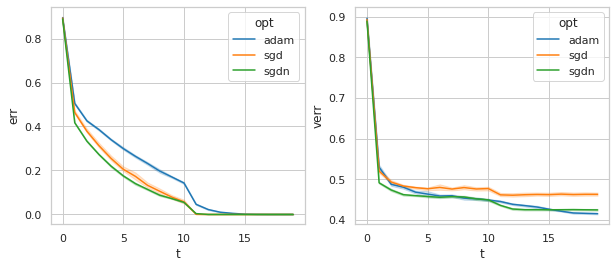

In [65]:
ii = get_idx(dc, "m == 'fc-1024-512-256-128' & bn == True")
fig, axes = plt.subplots(1,2, figsize=(10, 4))
sns.lineplot(data=dc.iloc[ii], x="t", y="err", hue="opt", ax=axes[0])
sns.lineplot(data=dc.iloc[ii], x="t", y="verr", hue="opt", ax=axes[1])

In [23]:
pg_df = pd.concat([dc, pd.DataFrame(r['xp'][:, :5], columns=[f'x{i}' for i in range(5)])], axis=1)

In [9]:
w = th.load(os.path.join(loc,'w_%s.p'%fn))

In [ ]:
loc = 'inpca_results'
fn = 'yvh_avg'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()

ax = plot_manifold(dc, r, dims=[0,1,2], key='m', 
                   queries=models,
                   ckey='opt', cdict=odict, cmap='Set1')
print(odict)

In [282]:
loc = 'inpca_results'
fn = 'yh_avg'

r = th.load(os.path.join(loc,'r_%s.p'%fn))
dc = th.load(os.path.join(loc,'didx_%s.p'%fn)).reset_index()
ax = plot_manifold(dc, r, dims=[0,1,2], key='m', 
                   queries=models,
                   ckey='err')

[ 1.38012346e+06 -2.57747340e+05  2.11123575e+05  8.95306400e+04
  4.99953805e+04 -1.65156846e+04 -4.71011175e+03 -1.56802863e+03
 -5.08899261e+02]


In [ ]:
def plot_cf(target, preds, title=''):
    classes = ['airplanes', 'cars', 'birds', 'cats', 'deer', 'dogs', 'frogs', 'horses', 'ships', 'trucks']
    cf = confusion_matrix(target, preds)
    df = pd.DataFrame(cf/np.sum(cf) *10, index = [i for i in classes], columns = [i for i in classes])
    plt.figure(figsize = (12,7))
    sns.heatmap(df, annot=True).set(title=title)

def plot_fn(i):
    plot_cf(ds['y'], th.argmax(d.iloc[i]['yh'], axis=1),
           title=f"{d.iloc[i]['t']}, {d.iloc[i]['err']:.2f}, {d.iloc[i]['m']}, {d.iloc[i]['opt']},  {d.iloc[i]['bn']}")
interact(plot_fn, i = widgets.IntText(value=519,
                                               min=0,
                                               max=3600,
                                               step=1))
# i = 519
# print(d.iloc[i]['t'], d.iloc[i]['err'])


sect = set(np.arange(3600))
for t in range(20):
    ii = get_idx(d, f"bn == True & t == {t}")
    preds = d.iloc[ii].apply(lambda r: th.argmax(r.yvh, axis=1), axis=1)
#     votes = th.mode(th.stack(list(preds.values)), dim=0).values
    n = len(preds)
    wrong_exp = th.where(th.sum(th.stack(list(preds.values)) != ds['yv'].repeat(n,1), axis=0) >= 0.9*n)[0]
    sect.intersection_update(set(wrong_exp.numpy()))
    print(t, len(wrong_exp), len(sect))
#     print(t, sum(votes != ds['y']))

In [ ]:
sect = set(np.arange(3600))
for t in range(5):
    ii = get_idx(d, f"bn == True & t == {t}")
    preds = d.iloc[ii].apply(lambda r: th.argmax(r.yh, axis=1), axis=1)
#     votes = th.mode(th.stack(list(preds.values)), dim=0).values
    n = len(preds)
    wrong_exp = th.where(th.sum(th.stack(list(preds.values)) != ds['y'].repeat(n,1), axis=0) >= 0.9*n)[0]
    sect.intersection_update(set(wrong_exp.numpy()))
    print(t, len(wrong_exp), len(sect))
#     print(t, sum(votes != ds['y']))

In [ ]:
for t in range(20):
    ii = get_idx(d, f"bn == True & t == {t}")
    preds = d.iloc[ii].apply(lambda r: th.argmax(r.yvh, axis=1), axis=1)
    votes = th.mode(th.stack(list(preds.values)), dim=0).values
    print(t, sum(votes != ds['yv']))